# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

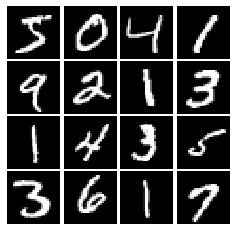

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(x, alpha * x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform([batch_size, dim], -1, 1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(256, input_shape=(784,)),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, input_shape=(noise_dim,)),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784, activation=tf.nn.tanh)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = tf.math.reduce_mean(tf.keras.losses.BinaryCrossentropy(from_logits=True).call(y_pred=logits_real, y_true=tf.ones(logits_real.shape))) + tf.math.reduce_mean(tf.keras.losses.BinaryCrossentropy(from_logits=True).call(y_pred=logits_fake, y_true=tf.zeros(logits_fake.shape)))
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = tf.keras.losses.BinaryCrossentropy(from_logits=True).call(y_pred=logits_fake, y_true=tf.ones(logits_fake.shape))
    loss = tf.math.reduce_mean(loss)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [13]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 0


In [14]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 7.19722e-17


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [15]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.optimizers.Adam(learning_rate, beta1)
    G_solver = tf.optimizers.Adam(learning_rate, beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [16]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.344, G:0.7458


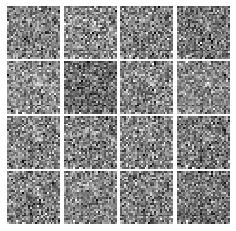

Epoch: 0, Iter: 20, D: 0.6422, G:0.8873


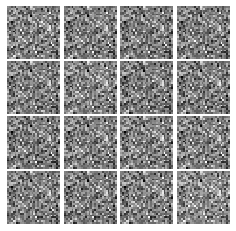

Epoch: 0, Iter: 40, D: 0.5237, G:1.076


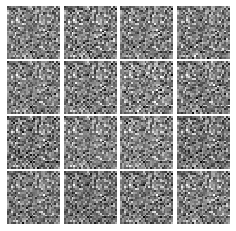

Epoch: 0, Iter: 60, D: 2.961, G:0.2432


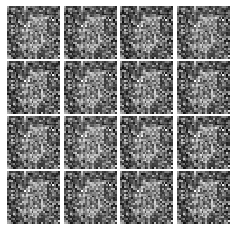

Epoch: 0, Iter: 80, D: 1.432, G:2.068


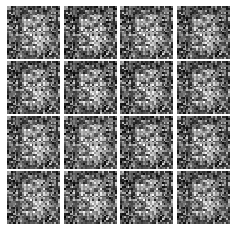

Epoch: 0, Iter: 100, D: 0.9952, G:1.548


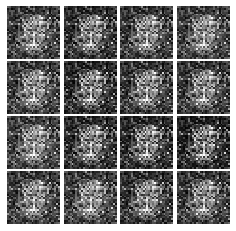

Epoch: 0, Iter: 120, D: 1.081, G:1.003


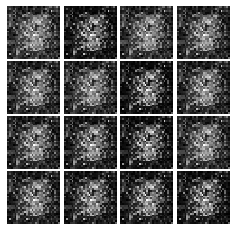

Epoch: 0, Iter: 140, D: 1.283, G:1.655


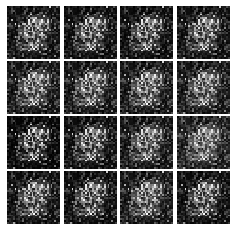

Epoch: 0, Iter: 160, D: 1.76, G:1.112


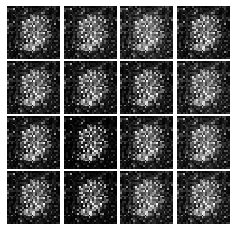

Epoch: 0, Iter: 180, D: 0.9394, G:1.509


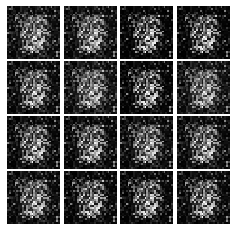

Epoch: 0, Iter: 200, D: 1.503, G:1.872


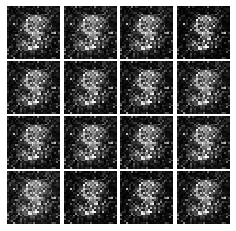

Epoch: 0, Iter: 220, D: 0.9326, G:1.833


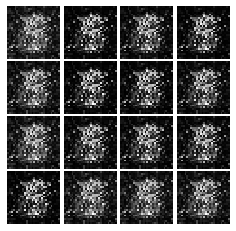

Epoch: 0, Iter: 240, D: 1.55, G:1.417


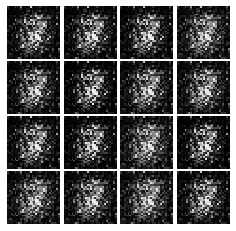

Epoch: 0, Iter: 260, D: 1.838, G:0.9603


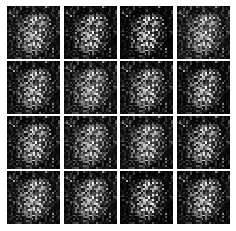

Epoch: 0, Iter: 280, D: 1.455, G:1.03


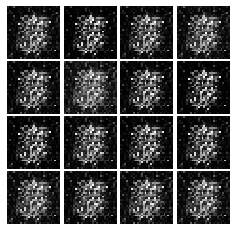

Epoch: 0, Iter: 300, D: 2.033, G:5.008


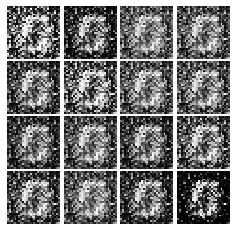

Epoch: 0, Iter: 320, D: 1.179, G:1.478


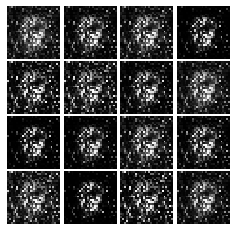

Epoch: 0, Iter: 340, D: 0.8903, G:1.547


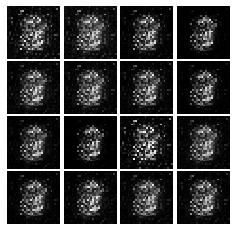

Epoch: 0, Iter: 360, D: 1.323, G:1.791


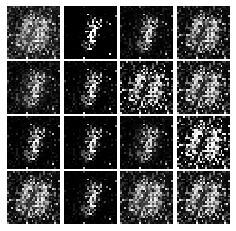

Epoch: 0, Iter: 380, D: 1.038, G:1.639


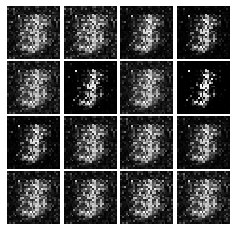

Epoch: 0, Iter: 400, D: 1.463, G:0.8373


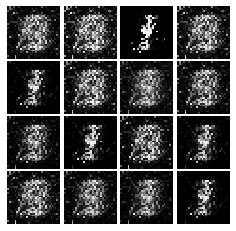

Epoch: 0, Iter: 420, D: 1.08, G:0.6902


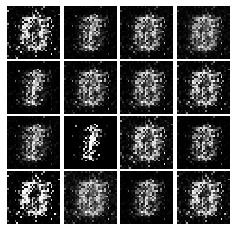

Epoch: 0, Iter: 440, D: 1.106, G:1.154


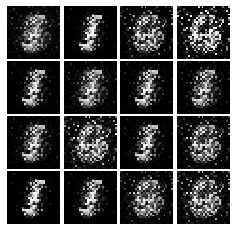

Epoch: 0, Iter: 460, D: 1.083, G:1.186


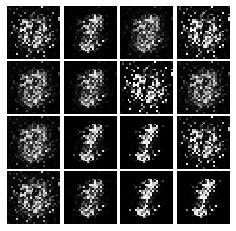

Epoch: 1, Iter: 480, D: 1.451, G:3.012


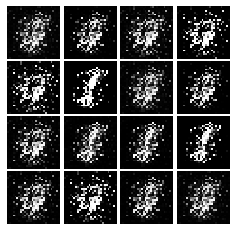

Epoch: 1, Iter: 500, D: 1.891, G:2.428


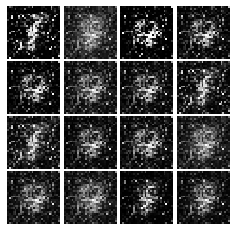

Epoch: 1, Iter: 520, D: 1.413, G:1.173


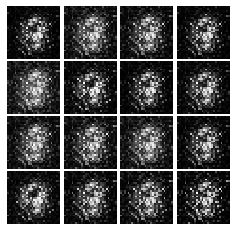

Epoch: 1, Iter: 540, D: 1.072, G:1.374


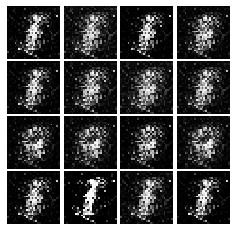

Epoch: 1, Iter: 560, D: 1.302, G:0.7585


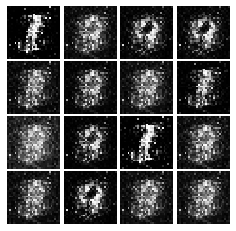

Epoch: 1, Iter: 580, D: 0.9135, G:1.94


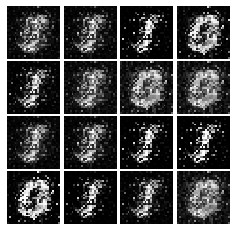

Epoch: 1, Iter: 600, D: 1.519, G:1.816


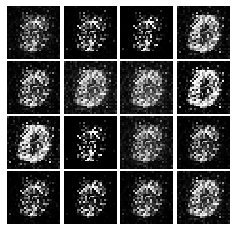

Epoch: 1, Iter: 620, D: 1.298, G:1.009


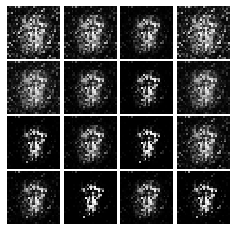

Epoch: 1, Iter: 640, D: 0.91, G:0.7512


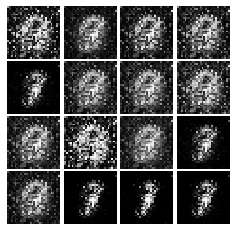

Epoch: 1, Iter: 660, D: 1.097, G:1.013


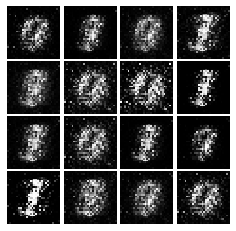

Epoch: 1, Iter: 680, D: 1.362, G:1.521


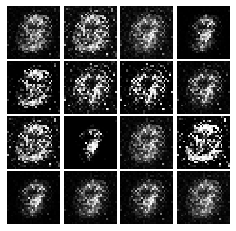

Epoch: 1, Iter: 700, D: 1.341, G:0.9771


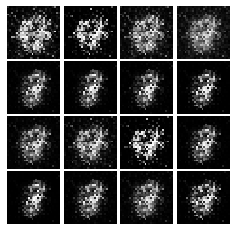

Epoch: 1, Iter: 720, D: 1.364, G:0.8743


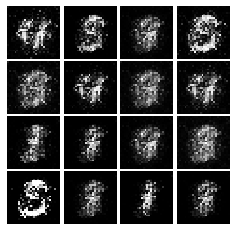

Epoch: 1, Iter: 740, D: 1.272, G:1.615


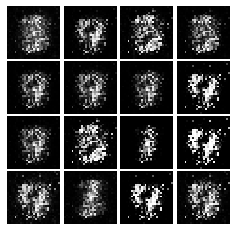

Epoch: 1, Iter: 760, D: 1.336, G:0.902


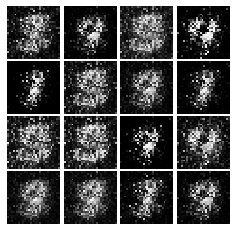

Epoch: 1, Iter: 780, D: 1.063, G:1.765


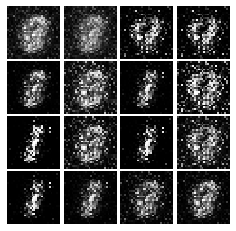

Epoch: 1, Iter: 800, D: 1.329, G:0.8494


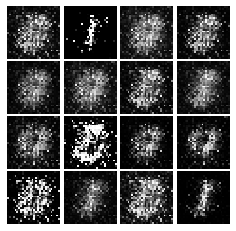

Epoch: 1, Iter: 820, D: 1.159, G:1.137


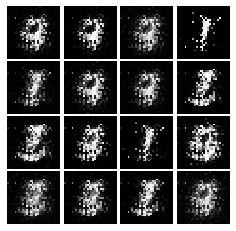

Epoch: 1, Iter: 840, D: 1.485, G:1.243


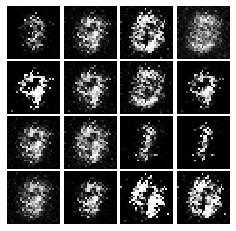

Epoch: 1, Iter: 860, D: 1.099, G:0.4681


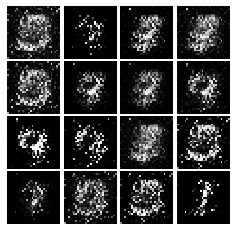

Epoch: 1, Iter: 880, D: 1.163, G:1.305


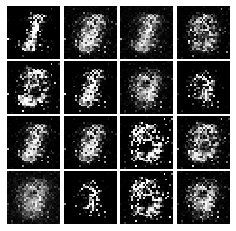

Epoch: 1, Iter: 900, D: 1.078, G:0.8849


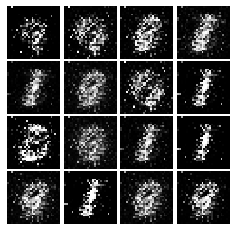

Epoch: 1, Iter: 920, D: 1.311, G:0.6795


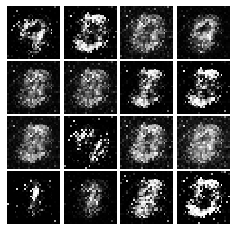

Epoch: 2, Iter: 940, D: 1.19, G:0.9875


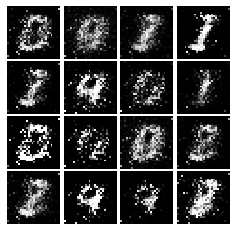

Epoch: 2, Iter: 960, D: 0.9981, G:1.271


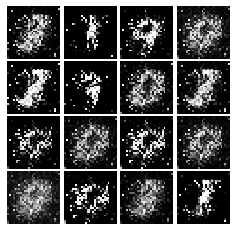

Epoch: 2, Iter: 980, D: 1.148, G:2.055


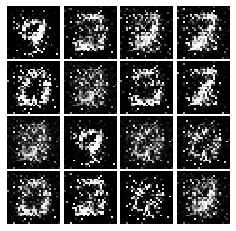

Epoch: 2, Iter: 1000, D: 1.007, G:1.467


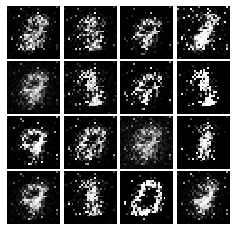

Epoch: 2, Iter: 1020, D: 1.34, G:0.4024


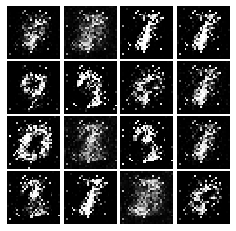

Epoch: 2, Iter: 1040, D: 1.273, G:1.489


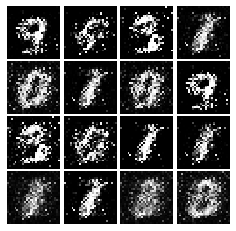

Epoch: 2, Iter: 1060, D: 1.491, G:0.8791


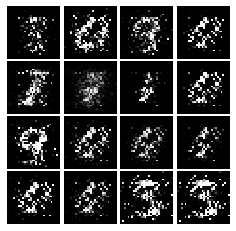

Epoch: 2, Iter: 1080, D: 1.211, G:1.144


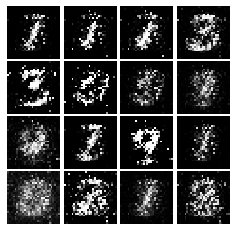

Epoch: 2, Iter: 1100, D: 1.524, G:6.7


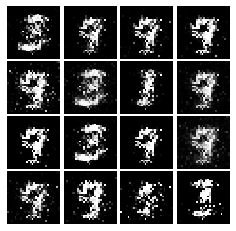

Epoch: 2, Iter: 1120, D: 1.228, G:0.9865


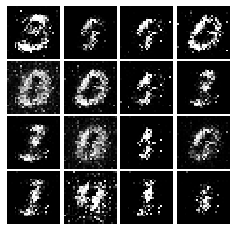

Epoch: 2, Iter: 1140, D: 1.452, G:0.6734


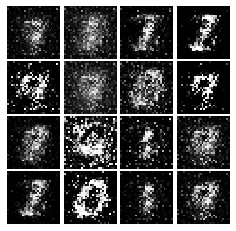

Epoch: 2, Iter: 1160, D: 1.088, G:1.128


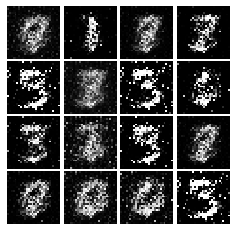

Epoch: 2, Iter: 1180, D: 1.278, G:1.007


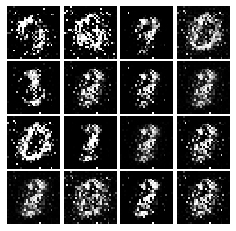

Epoch: 2, Iter: 1200, D: 1.114, G:1.18


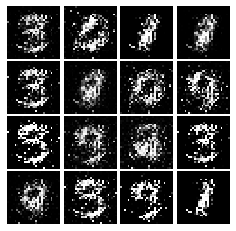

Epoch: 2, Iter: 1220, D: 1.514, G:1.818


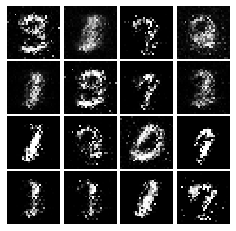

Epoch: 2, Iter: 1240, D: 1.091, G:1.793


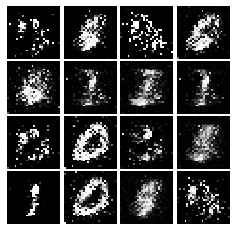

Epoch: 2, Iter: 1260, D: 1.567, G:0.8527


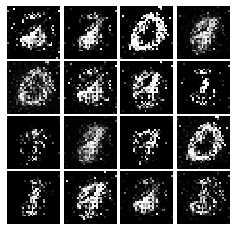

Epoch: 2, Iter: 1280, D: 1.285, G:0.9698


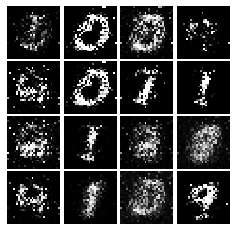

Epoch: 2, Iter: 1300, D: 1.206, G:1.028


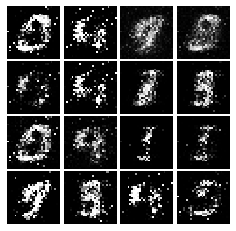

Epoch: 2, Iter: 1320, D: 1.269, G:1.215


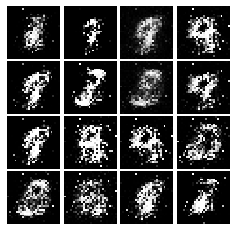

Epoch: 2, Iter: 1340, D: 1.341, G:1.603


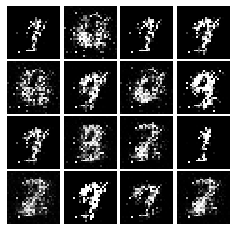

Epoch: 2, Iter: 1360, D: 1.273, G:0.9709


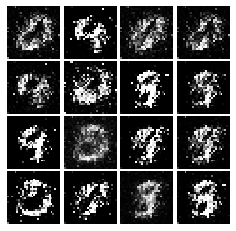

Epoch: 2, Iter: 1380, D: 1.11, G:0.8111


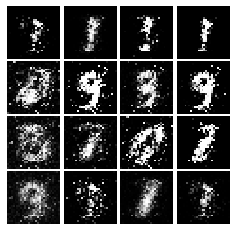

Epoch: 2, Iter: 1400, D: 1.148, G:1.035


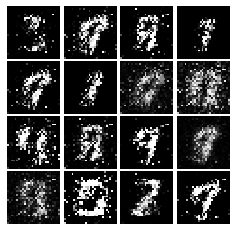

Epoch: 3, Iter: 1420, D: 1.158, G:1.274


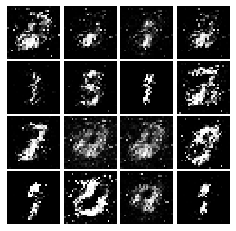

Epoch: 3, Iter: 1440, D: 1.236, G:0.888


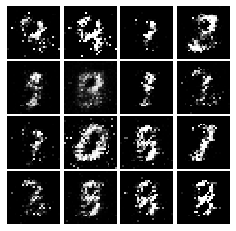

Epoch: 3, Iter: 1460, D: 1.046, G:1.15


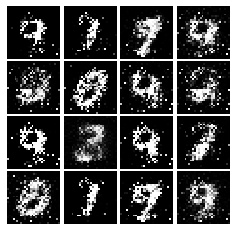

Epoch: 3, Iter: 1480, D: 1.145, G:1.041


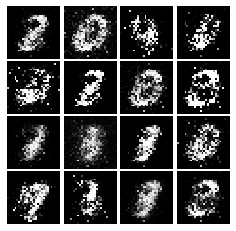

Epoch: 3, Iter: 1500, D: 1.295, G:0.978


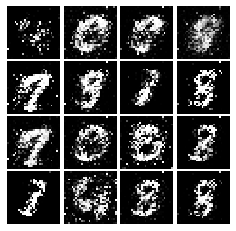

Epoch: 3, Iter: 1520, D: 1.207, G:1.167


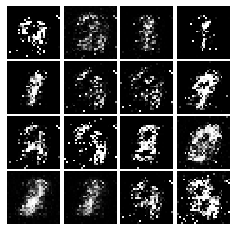

Epoch: 3, Iter: 1540, D: 1.298, G:0.9338


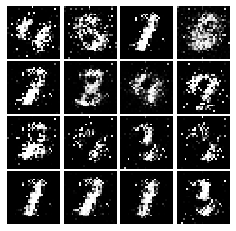

Epoch: 3, Iter: 1560, D: 1.163, G:0.7634


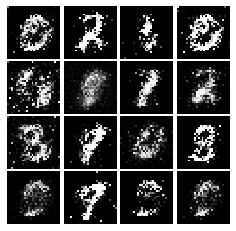

Epoch: 3, Iter: 1580, D: 1.324, G:1.152


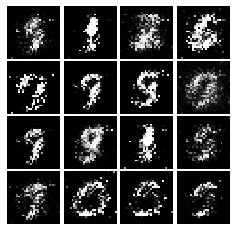

Epoch: 3, Iter: 1600, D: 1.258, G:0.9067


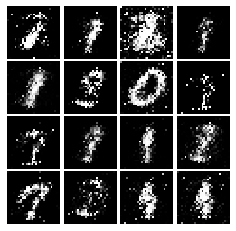

Epoch: 3, Iter: 1620, D: 1.07, G:1.174


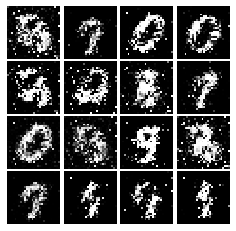

Epoch: 3, Iter: 1640, D: 1.328, G:0.9055


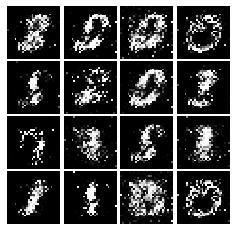

Epoch: 3, Iter: 1660, D: 1.142, G:1.359


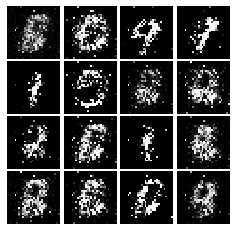

Epoch: 3, Iter: 1680, D: 1.319, G:0.9548


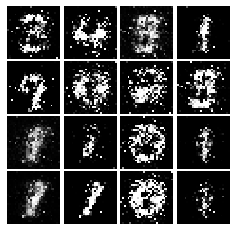

Epoch: 3, Iter: 1700, D: 1.373, G:1.22


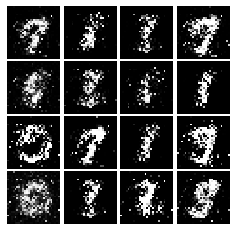

Epoch: 3, Iter: 1720, D: 1.376, G:1.039


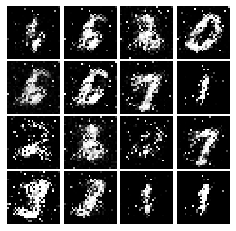

Epoch: 3, Iter: 1740, D: 1.124, G:0.9951


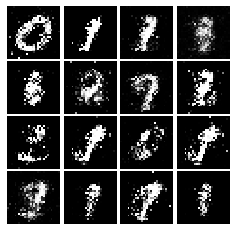

Epoch: 3, Iter: 1760, D: 0.9051, G:1.098


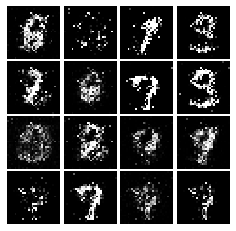

Epoch: 3, Iter: 1780, D: 0.9915, G:1.109


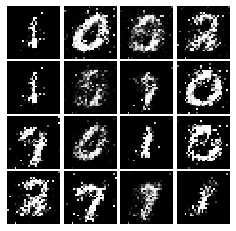

Epoch: 3, Iter: 1800, D: 1.403, G:1.005


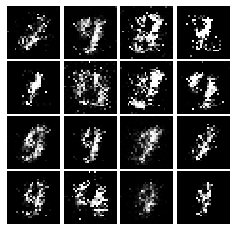

Epoch: 3, Iter: 1820, D: 1.239, G:0.9398


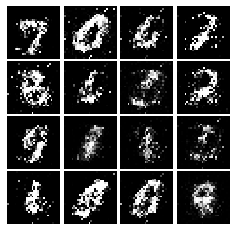

Epoch: 3, Iter: 1840, D: 1.268, G:0.9312


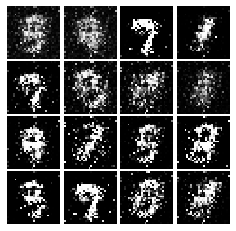

Epoch: 3, Iter: 1860, D: 1.268, G:0.8898


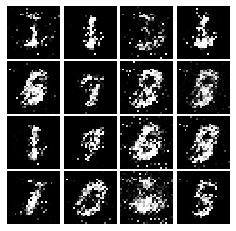

Epoch: 4, Iter: 1880, D: 1.397, G:1.15


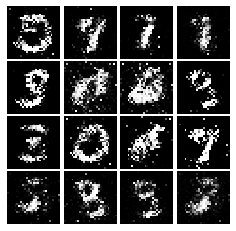

Epoch: 4, Iter: 1900, D: 1.275, G:0.9049


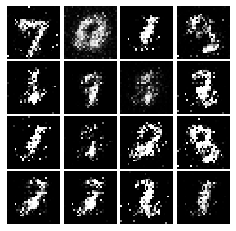

Epoch: 4, Iter: 1920, D: 1.301, G:0.9265


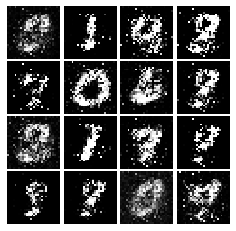

Epoch: 4, Iter: 1940, D: 1.907, G:1.696


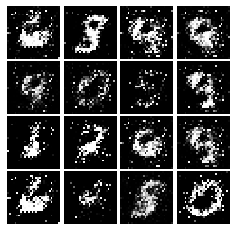

Epoch: 4, Iter: 1960, D: 1.385, G:0.8564


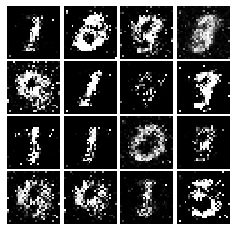

Epoch: 4, Iter: 1980, D: 1.261, G:1.081


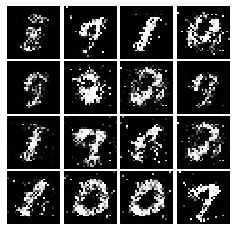

Epoch: 4, Iter: 2000, D: 1.086, G:0.9375


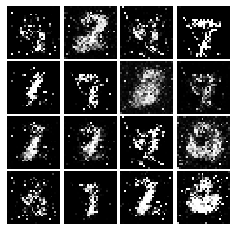

Epoch: 4, Iter: 2020, D: 1.219, G:0.8246


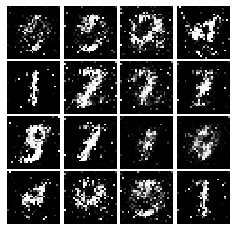

Epoch: 4, Iter: 2040, D: 1.796, G:0.9287


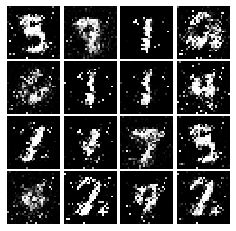

Epoch: 4, Iter: 2060, D: 1.29, G:0.9482


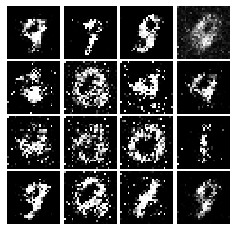

Epoch: 4, Iter: 2080, D: 1.185, G:1.016


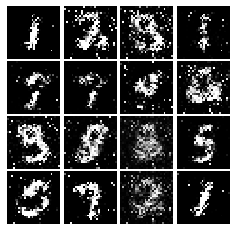

Epoch: 4, Iter: 2100, D: 1.36, G:0.9512


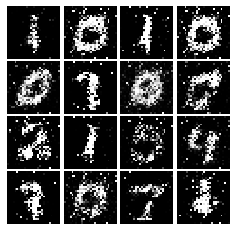

Epoch: 4, Iter: 2120, D: 1.361, G:1.136


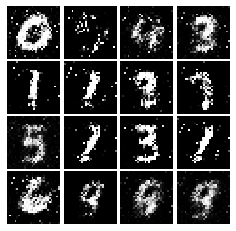

Epoch: 4, Iter: 2140, D: 1.27, G:0.8533


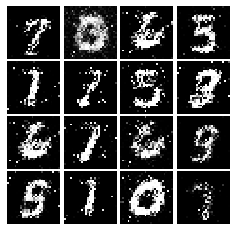

Epoch: 4, Iter: 2160, D: 1.409, G:1.006


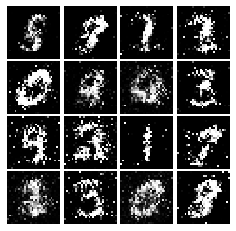

Epoch: 4, Iter: 2180, D: 1.222, G:0.9582


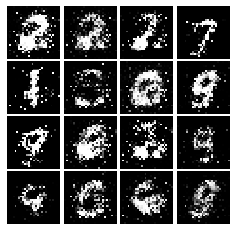

Epoch: 4, Iter: 2200, D: 1.184, G:1.283


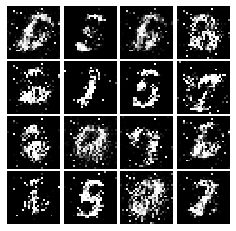

Epoch: 4, Iter: 2220, D: 1.165, G:1.27


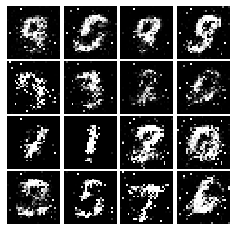

Epoch: 4, Iter: 2240, D: 1.12, G:1.237


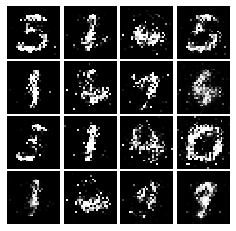

Epoch: 4, Iter: 2260, D: 1.263, G:1.139


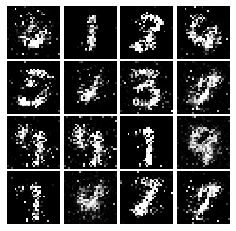

Epoch: 4, Iter: 2280, D: 1.26, G:1.101


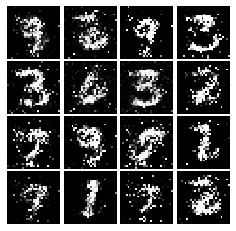

Epoch: 4, Iter: 2300, D: 1.22, G:0.9645


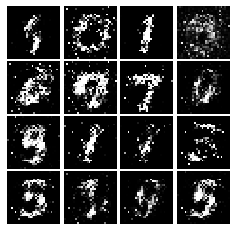

Epoch: 4, Iter: 2320, D: 1.25, G:0.9192


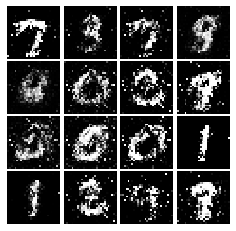

Epoch: 4, Iter: 2340, D: 1.184, G:1.072


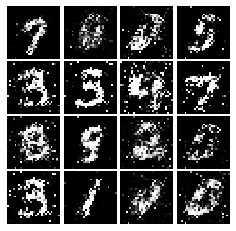

Epoch: 5, Iter: 2360, D: 1.327, G:0.9897


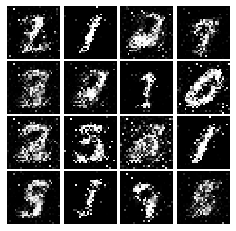

Epoch: 5, Iter: 2380, D: 1.236, G:0.7901


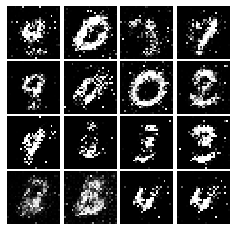

Epoch: 5, Iter: 2400, D: 1.223, G:0.8049


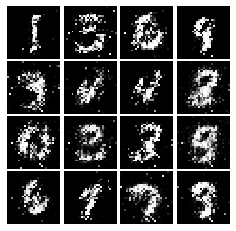

Epoch: 5, Iter: 2420, D: 1.229, G:0.8485


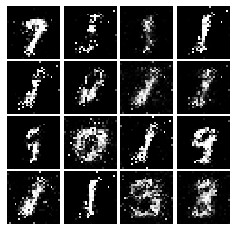

Epoch: 5, Iter: 2440, D: 1.24, G:0.9132


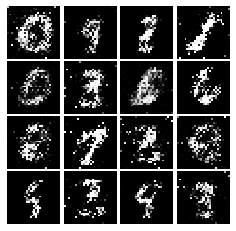

Epoch: 5, Iter: 2460, D: 1.305, G:0.6374


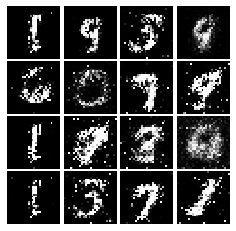

Epoch: 5, Iter: 2480, D: 1.421, G:0.9511


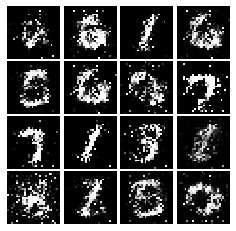

Epoch: 5, Iter: 2500, D: 1.175, G:0.887


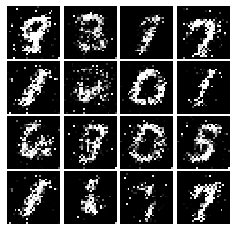

Epoch: 5, Iter: 2520, D: 1.356, G:0.8796


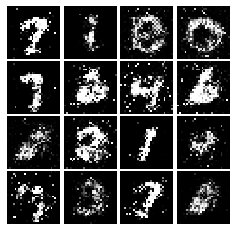

Epoch: 5, Iter: 2540, D: 1.343, G:0.7974


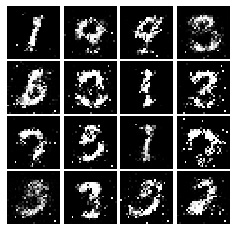

Epoch: 5, Iter: 2560, D: 1.297, G:0.9253


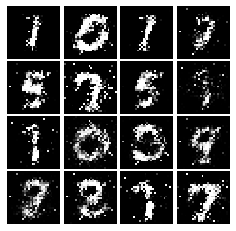

Epoch: 5, Iter: 2580, D: 1.266, G:0.8389


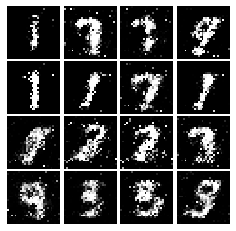

Epoch: 5, Iter: 2600, D: 1.357, G:0.9042


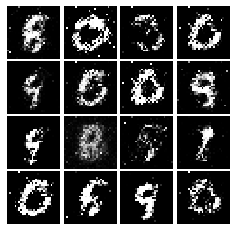

Epoch: 5, Iter: 2620, D: 1.246, G:0.8529


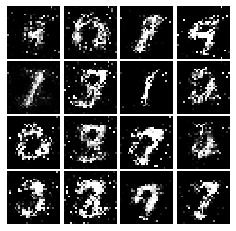

Epoch: 5, Iter: 2640, D: 1.281, G:0.8944


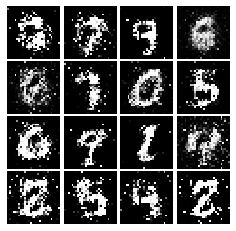

Epoch: 5, Iter: 2660, D: 1.339, G:0.9279


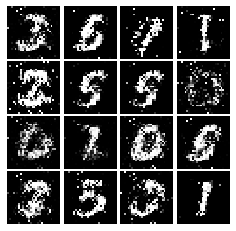

Epoch: 5, Iter: 2680, D: 1.397, G:0.9019


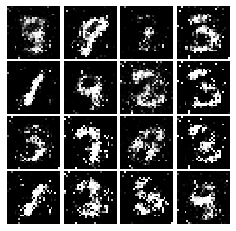

Epoch: 5, Iter: 2700, D: 1.362, G:0.9125


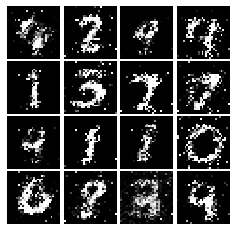

Epoch: 5, Iter: 2720, D: 1.19, G:1.043


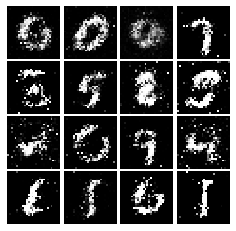

Epoch: 5, Iter: 2740, D: 1.215, G:0.8086


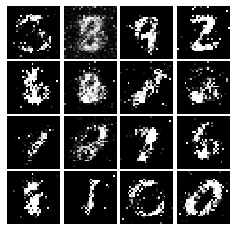

Epoch: 5, Iter: 2760, D: 1.158, G:2.821


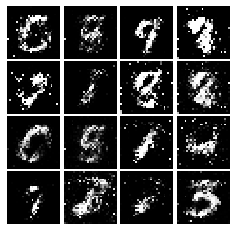

Epoch: 5, Iter: 2780, D: 1.46, G:0.7297


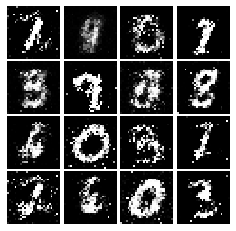

Epoch: 5, Iter: 2800, D: 1.22, G:0.932


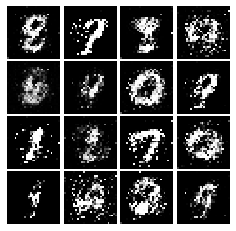

Epoch: 6, Iter: 2820, D: 1.495, G:1.014


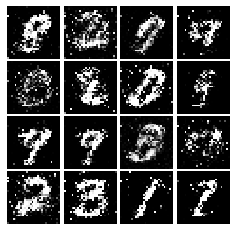

Epoch: 6, Iter: 2840, D: 1.225, G:0.8292


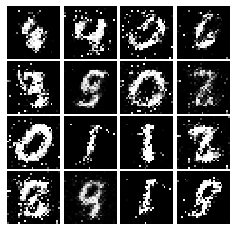

Epoch: 6, Iter: 2860, D: 1.187, G:0.9646


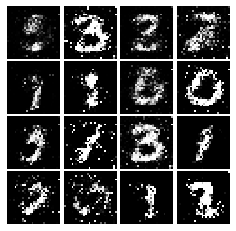

Epoch: 6, Iter: 2880, D: 1.383, G:0.8643


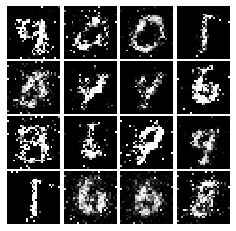

Epoch: 6, Iter: 2900, D: 1.341, G:0.9178


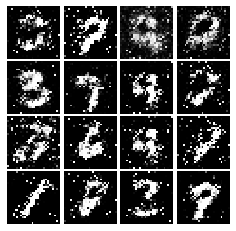

Epoch: 6, Iter: 2920, D: 1.308, G:0.8687


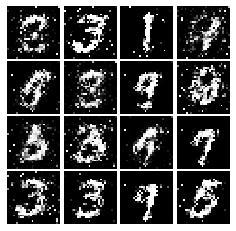

Epoch: 6, Iter: 2940, D: 1.252, G:1.016


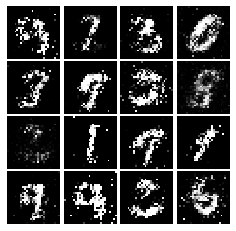

Epoch: 6, Iter: 2960, D: 1.344, G:0.9375


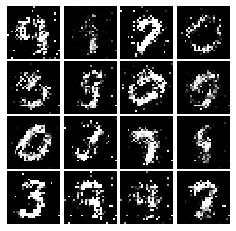

Epoch: 6, Iter: 2980, D: 1.447, G:0.7906


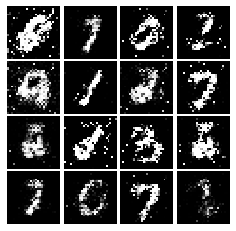

Epoch: 6, Iter: 3000, D: 1.332, G:0.881


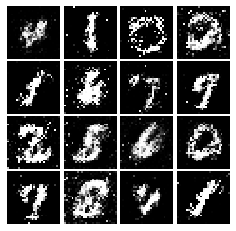

Epoch: 6, Iter: 3020, D: 1.473, G:0.7033


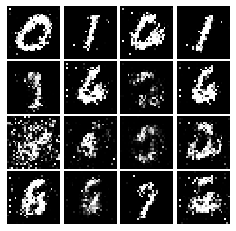

Epoch: 6, Iter: 3040, D: 1.357, G:0.8375


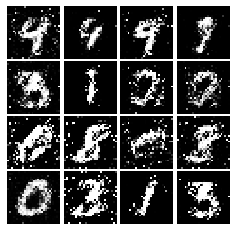

Epoch: 6, Iter: 3060, D: 1.35, G:0.7162


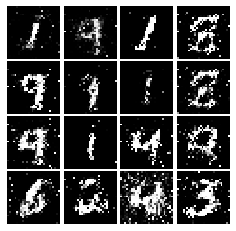

Epoch: 6, Iter: 3080, D: 1.313, G:0.8385


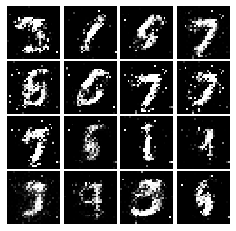

Epoch: 6, Iter: 3100, D: 1.148, G:0.8912


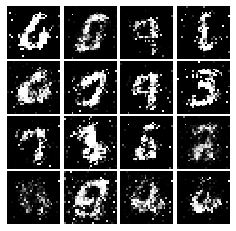

Epoch: 6, Iter: 3120, D: 1.327, G:0.8012


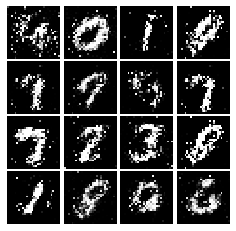

Epoch: 6, Iter: 3140, D: 1.39, G:0.8831


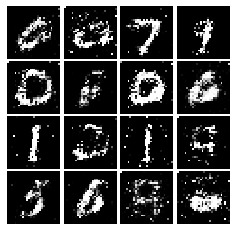

Epoch: 6, Iter: 3160, D: 1.152, G:0.9667


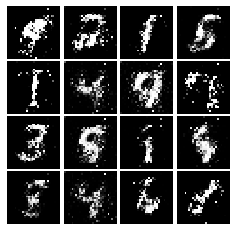

Epoch: 6, Iter: 3180, D: 1.29, G:0.7734


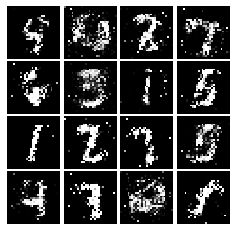

Epoch: 6, Iter: 3200, D: 1.344, G:0.8592


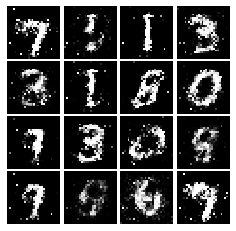

Epoch: 6, Iter: 3220, D: 1.278, G:0.8533


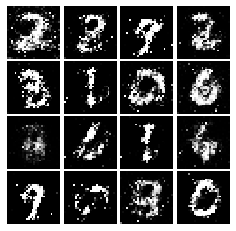

Epoch: 6, Iter: 3240, D: 1.333, G:0.857


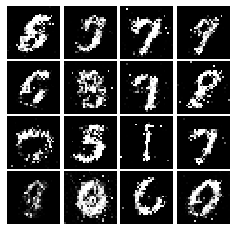

Epoch: 6, Iter: 3260, D: 1.406, G:0.7366


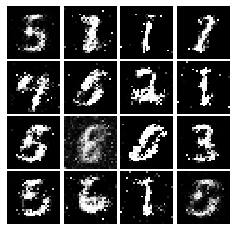

Epoch: 6, Iter: 3280, D: 1.282, G:0.6948


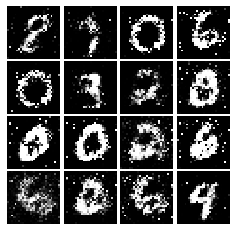

Epoch: 7, Iter: 3300, D: 1.31, G:0.8429


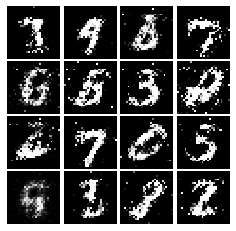

Epoch: 7, Iter: 3320, D: 1.339, G:0.7453


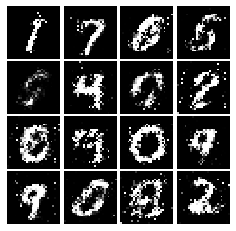

Epoch: 7, Iter: 3340, D: 1.293, G:0.8345


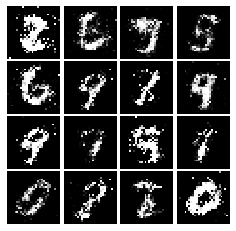

Epoch: 7, Iter: 3360, D: 1.415, G:0.7524


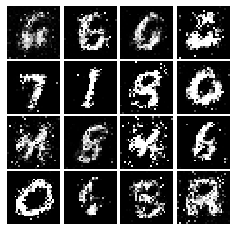

Epoch: 7, Iter: 3380, D: 1.292, G:0.8234


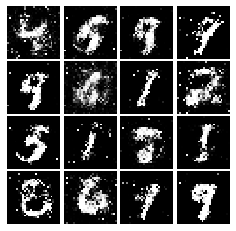

Epoch: 7, Iter: 3400, D: 1.357, G:0.7405


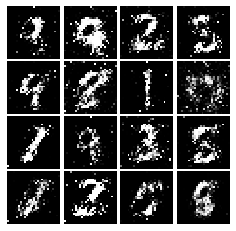

Epoch: 7, Iter: 3420, D: 1.346, G:0.7962


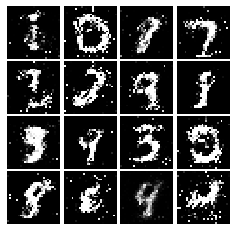

Epoch: 7, Iter: 3440, D: 1.266, G:0.8142


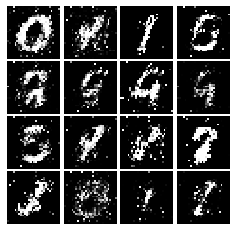

Epoch: 7, Iter: 3460, D: 1.28, G:0.8809


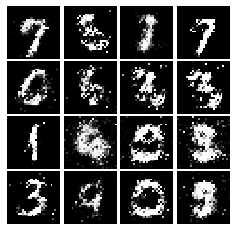

Epoch: 7, Iter: 3480, D: 1.378, G:0.7403


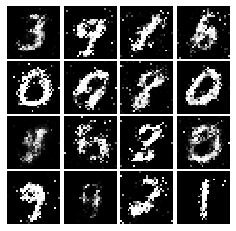

Epoch: 7, Iter: 3500, D: 1.342, G:0.7467


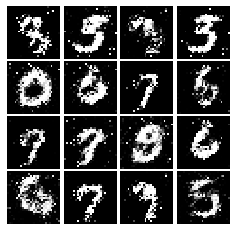

Epoch: 7, Iter: 3520, D: 1.323, G:0.8804


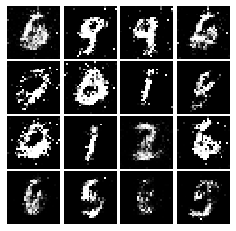

Epoch: 7, Iter: 3540, D: 1.331, G:0.7904


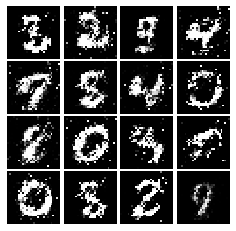

Epoch: 7, Iter: 3560, D: 1.251, G:1.465


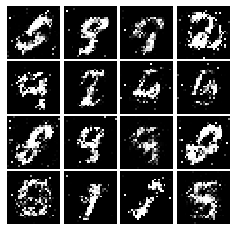

Epoch: 7, Iter: 3580, D: 1.279, G:0.7959


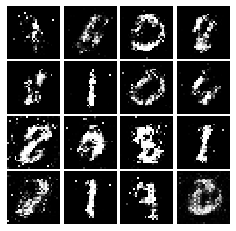

Epoch: 7, Iter: 3600, D: 1.281, G:0.7948


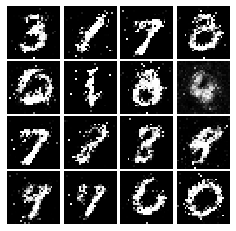

Epoch: 7, Iter: 3620, D: 1.385, G:0.8243


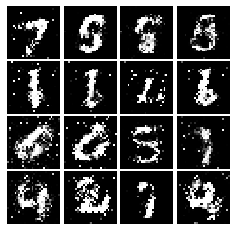

Epoch: 7, Iter: 3640, D: 1.273, G:0.7981


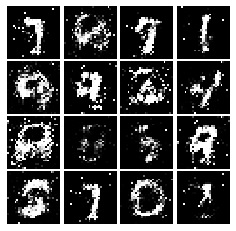

Epoch: 7, Iter: 3660, D: 1.348, G:0.8228


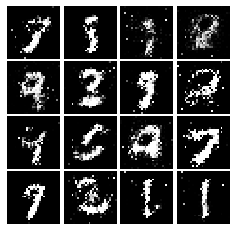

Epoch: 7, Iter: 3680, D: 1.32, G:0.7751


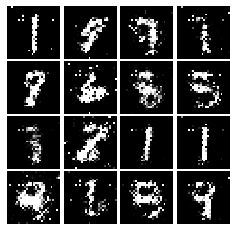

Epoch: 7, Iter: 3700, D: 1.269, G:0.8203


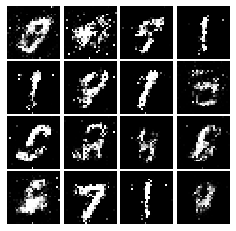

Epoch: 7, Iter: 3720, D: 1.353, G:0.8662


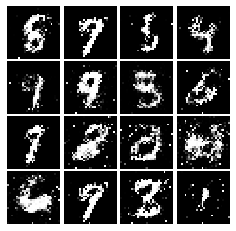

Epoch: 7, Iter: 3740, D: 1.417, G:0.6502


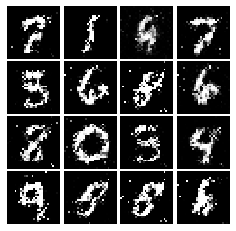

Epoch: 8, Iter: 3760, D: 1.373, G:0.7461


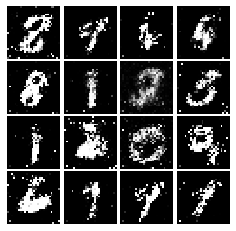

Epoch: 8, Iter: 3780, D: 1.326, G:0.7857


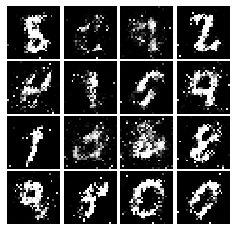

Epoch: 8, Iter: 3800, D: 1.327, G:0.8523


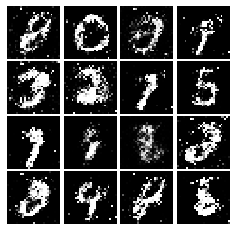

Epoch: 8, Iter: 3820, D: 1.265, G:0.9243


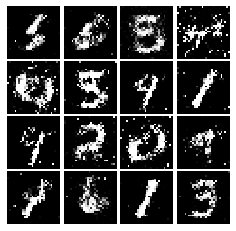

Epoch: 8, Iter: 3840, D: 1.235, G:0.8686


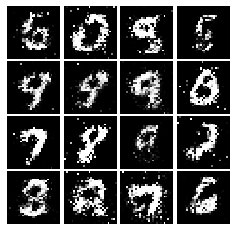

Epoch: 8, Iter: 3860, D: 1.302, G:0.8824


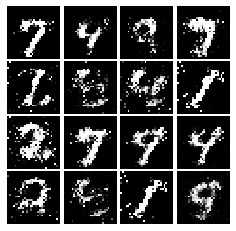

Epoch: 8, Iter: 3880, D: 1.281, G:0.7676


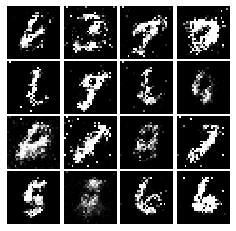

Epoch: 8, Iter: 3900, D: 1.339, G:0.7684


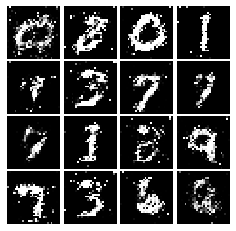

Epoch: 8, Iter: 3920, D: 1.344, G:0.9253


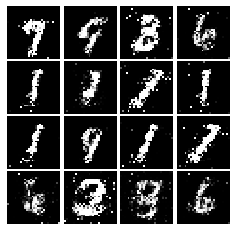

Epoch: 8, Iter: 3940, D: 1.415, G:0.8376


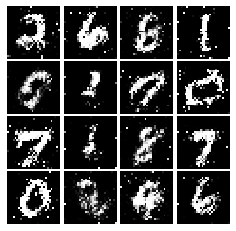

Epoch: 8, Iter: 3960, D: 1.285, G:0.9174


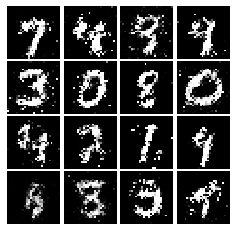

Epoch: 8, Iter: 3980, D: 1.23, G:0.8615


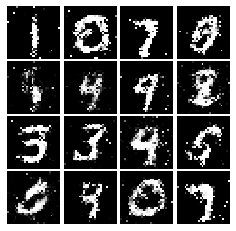

Epoch: 8, Iter: 4000, D: 1.251, G:0.9298


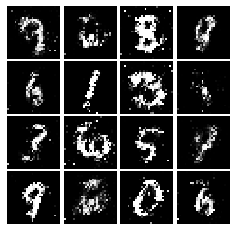

Epoch: 8, Iter: 4020, D: 1.294, G:0.8091


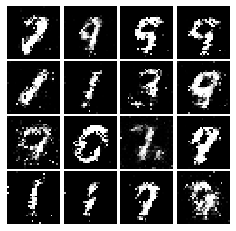

Epoch: 8, Iter: 4040, D: 1.316, G:0.8395


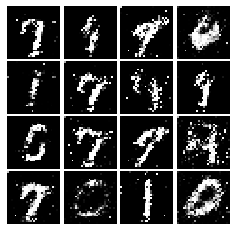

Epoch: 8, Iter: 4060, D: 1.277, G:0.823


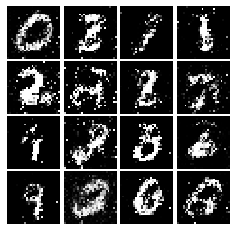

Epoch: 8, Iter: 4080, D: 1.403, G:0.8027


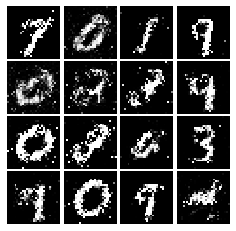

Epoch: 8, Iter: 4100, D: 1.291, G:0.8632


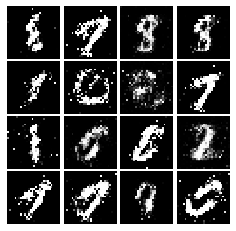

Epoch: 8, Iter: 4120, D: 1.36, G:0.8677


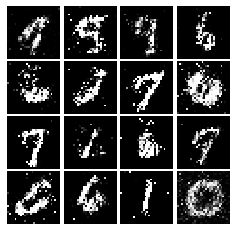

Epoch: 8, Iter: 4140, D: 1.333, G:0.8576


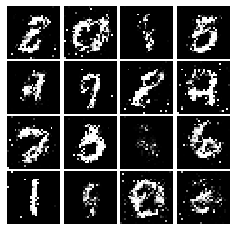

Epoch: 8, Iter: 4160, D: 1.437, G:1.057


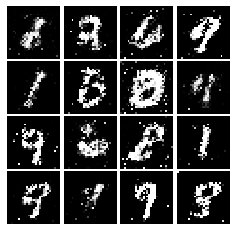

Epoch: 8, Iter: 4180, D: 1.55, G:0.7513


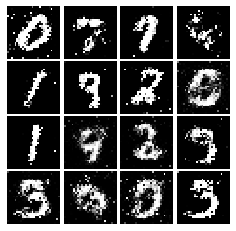

Epoch: 8, Iter: 4200, D: 1.347, G:0.9769


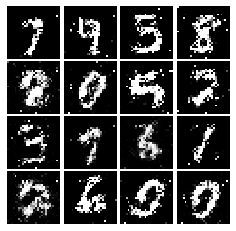

Epoch: 8, Iter: 4220, D: 1.282, G:0.922


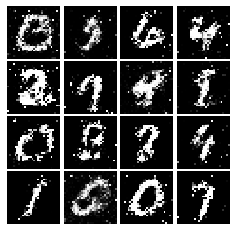

Epoch: 9, Iter: 4240, D: 1.659, G:0.8344


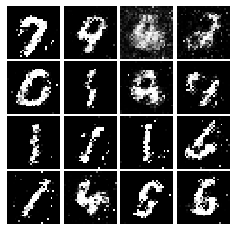

Epoch: 9, Iter: 4260, D: 1.345, G:0.8152


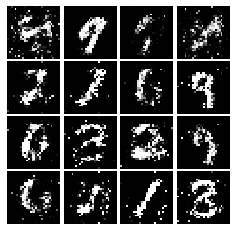

Epoch: 9, Iter: 4280, D: 1.338, G:0.7995


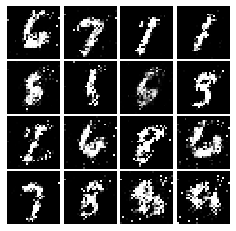

Epoch: 9, Iter: 4300, D: 1.407, G:0.824


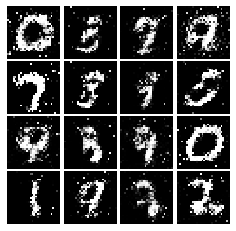

Epoch: 9, Iter: 4320, D: 1.234, G:0.7989


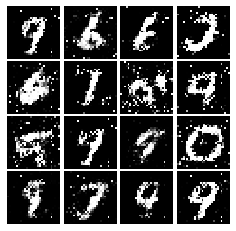

Epoch: 9, Iter: 4340, D: 1.329, G:0.7986


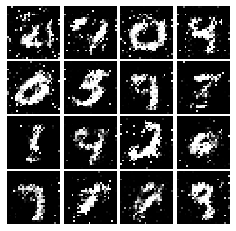

Epoch: 9, Iter: 4360, D: 1.38, G:0.764


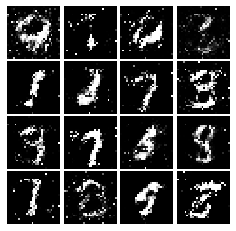

Epoch: 9, Iter: 4380, D: 1.373, G:0.7326


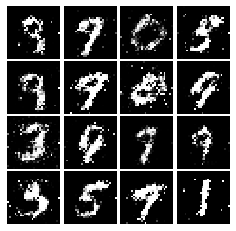

Epoch: 9, Iter: 4400, D: 1.31, G:0.9088


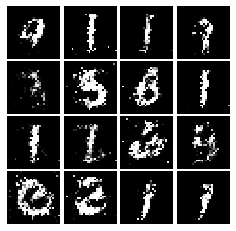

Epoch: 9, Iter: 4420, D: 1.296, G:0.7835


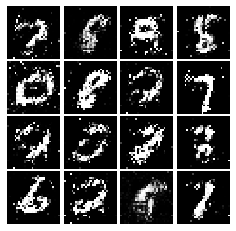

Epoch: 9, Iter: 4440, D: 1.305, G:0.8032


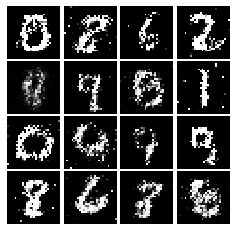

Epoch: 9, Iter: 4460, D: 1.362, G:0.7537


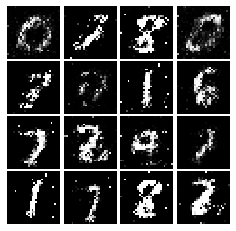

Epoch: 9, Iter: 4480, D: 1.316, G:0.7922


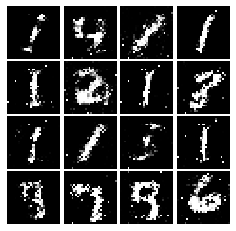

Epoch: 9, Iter: 4500, D: 1.428, G:0.8242


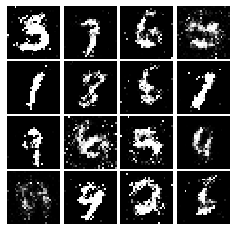

Epoch: 9, Iter: 4520, D: 1.32, G:0.8381


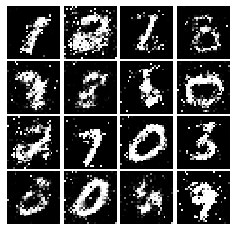

Epoch: 9, Iter: 4540, D: 1.346, G:0.7879


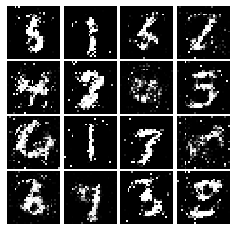

Epoch: 9, Iter: 4560, D: 1.279, G:0.7685


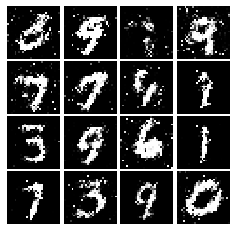

Epoch: 9, Iter: 4580, D: 1.31, G:0.8336


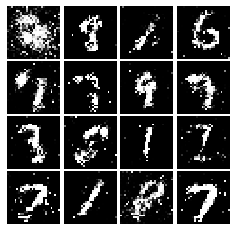

Epoch: 9, Iter: 4600, D: 1.342, G:0.7973


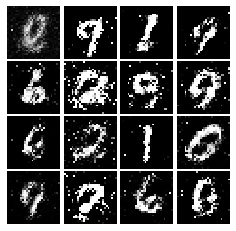

Epoch: 9, Iter: 4620, D: 1.316, G:0.7931


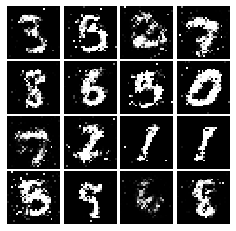

Epoch: 9, Iter: 4640, D: 1.295, G:0.877


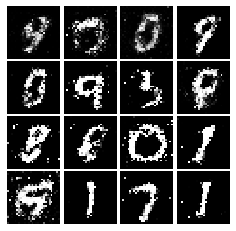

Epoch: 9, Iter: 4660, D: 1.363, G:0.7103


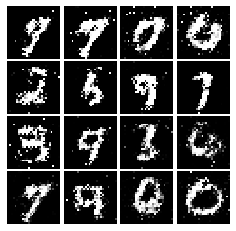

Epoch: 9, Iter: 4680, D: 1.389, G:0.8252


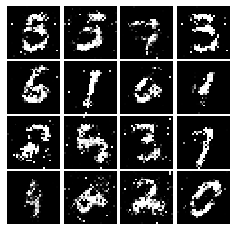

Final images


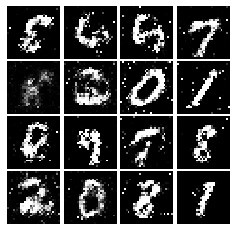

In [205]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [22]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.math.reduce_mean(tf.math.square(scores_real-1)) + 0.5 * tf.math.reduce_mean(tf.math.square(scores_fake))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.math.reduce_mean(tf.math.square(scores_fake-1))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [23]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.6682, G:0.3591


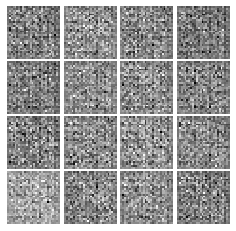

Epoch: 0, Iter: 20, D: 0.06948, G:0.4722


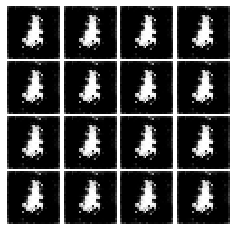

Epoch: 0, Iter: 40, D: 0.02481, G:0.5284


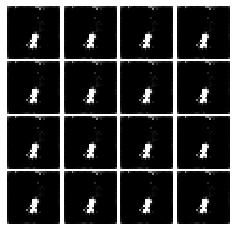

Epoch: 0, Iter: 60, D: 0.01143, G:0.4566


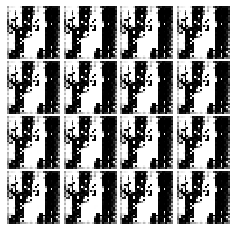

Epoch: 0, Iter: 80, D: 0.02019, G:0.6019


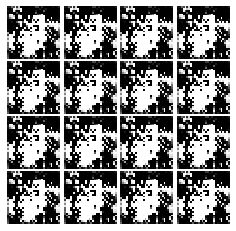

Epoch: 0, Iter: 100, D: 0.003305, G:0.5167


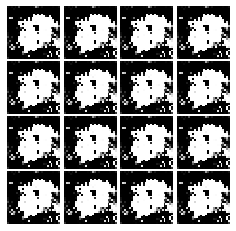

Epoch: 0, Iter: 120, D: 0.02657, G:0.5453


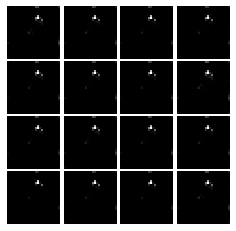

Epoch: 0, Iter: 140, D: 0.1282, G:0.9298


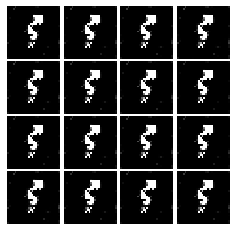

Epoch: 0, Iter: 160, D: 0.01836, G:0.5904


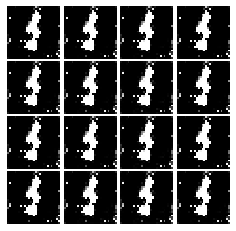

Epoch: 0, Iter: 180, D: 0.03955, G:0.4596


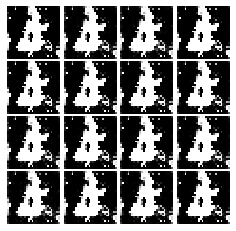

Epoch: 0, Iter: 200, D: 0.003958, G:0.5856


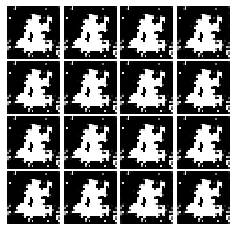

Epoch: 0, Iter: 220, D: 0.01399, G:0.5665


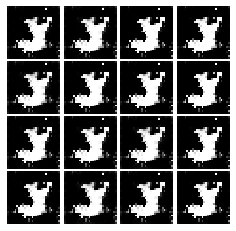

Epoch: 0, Iter: 240, D: 0.1842, G:0.6458


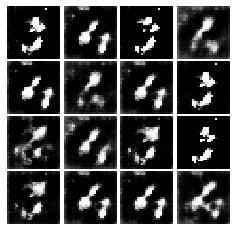

Epoch: 0, Iter: 260, D: 0.1186, G:0.3232


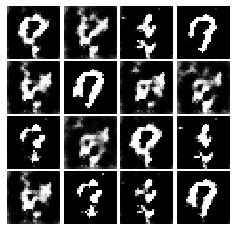

Epoch: 0, Iter: 280, D: 0.2059, G:0.3066


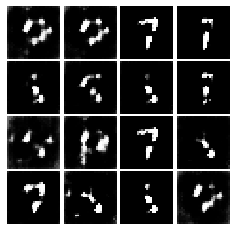

Epoch: 0, Iter: 300, D: 0.4082, G:0.6226


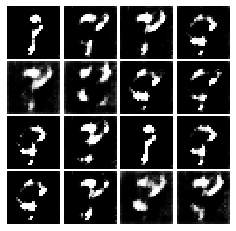

Epoch: 0, Iter: 320, D: 0.08976, G:0.3839


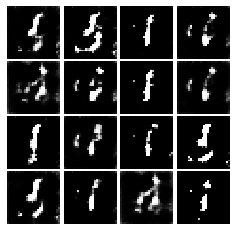

Epoch: 0, Iter: 340, D: 0.1104, G:0.4432


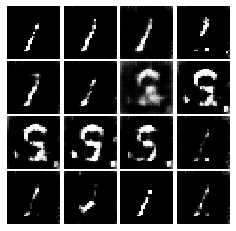

Epoch: 0, Iter: 360, D: 0.07705, G:0.4267


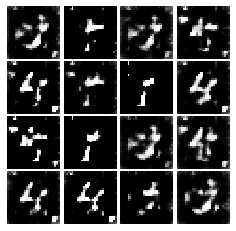

Epoch: 0, Iter: 380, D: 0.08125, G:0.3597


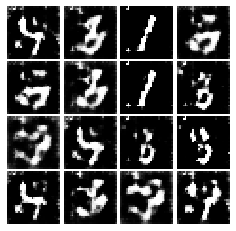

Epoch: 0, Iter: 400, D: 0.09517, G:0.2791


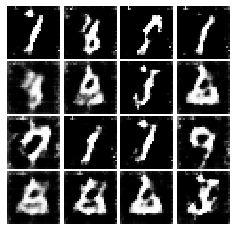

Epoch: 0, Iter: 420, D: 0.07964, G:0.3664


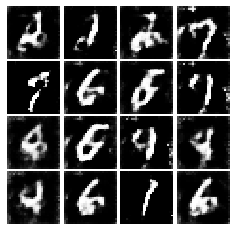

Epoch: 0, Iter: 440, D: 0.07956, G:0.3719


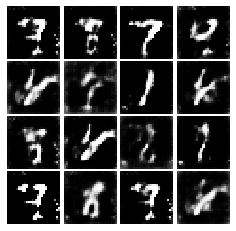

Epoch: 0, Iter: 460, D: 0.06156, G:0.5037


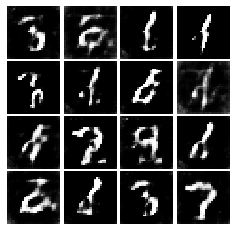

Epoch: 1, Iter: 480, D: 0.1037, G:0.3778


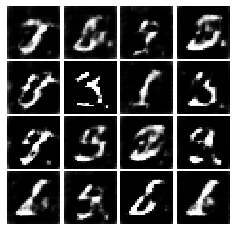

Epoch: 1, Iter: 500, D: 0.111, G:0.3031


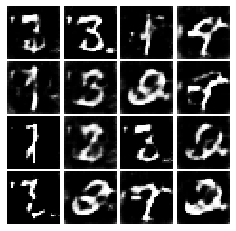

Epoch: 1, Iter: 520, D: 0.08981, G:0.3281


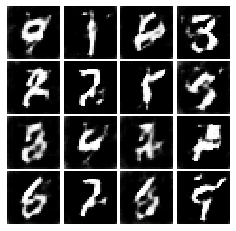

Epoch: 1, Iter: 540, D: 0.1635, G:0.4184


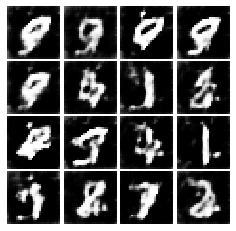

Epoch: 1, Iter: 560, D: 0.1335, G:0.3097


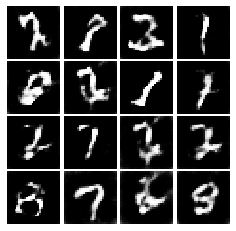

Epoch: 1, Iter: 580, D: 0.1254, G:0.2532


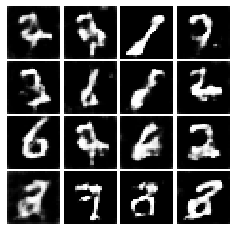

Epoch: 1, Iter: 600, D: 0.1249, G:0.3522


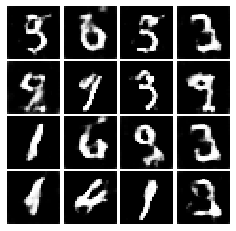

Epoch: 1, Iter: 620, D: 0.1204, G:0.2444


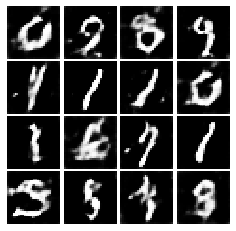

Epoch: 1, Iter: 640, D: 0.1555, G:0.3288


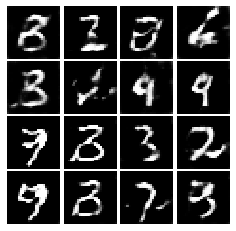

Epoch: 1, Iter: 660, D: 0.1264, G:0.2601


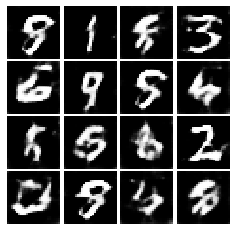

Epoch: 1, Iter: 680, D: 0.1454, G:0.3012


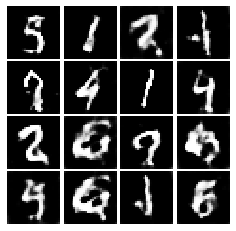

Epoch: 1, Iter: 700, D: 0.1234, G:0.2908


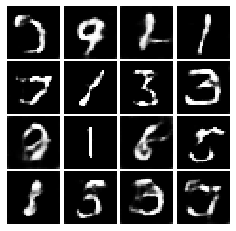

Epoch: 1, Iter: 720, D: 0.1234, G:0.5975


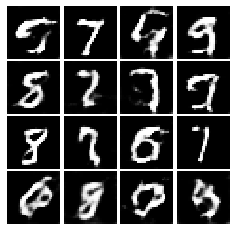

Epoch: 1, Iter: 740, D: 0.146, G:0.2174


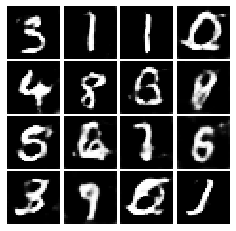

Epoch: 1, Iter: 760, D: 0.1228, G:0.2899


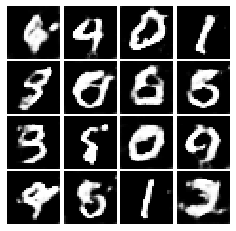

Epoch: 1, Iter: 780, D: 0.124, G:0.289


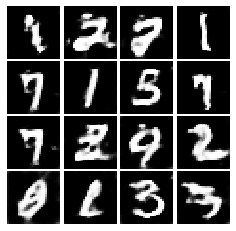

Epoch: 1, Iter: 800, D: 0.1948, G:0.3618


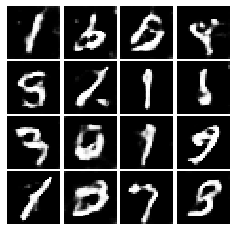

Epoch: 1, Iter: 820, D: 0.1539, G:0.2705


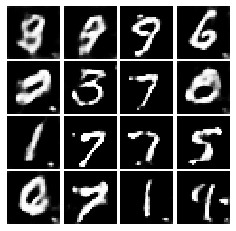

Epoch: 1, Iter: 840, D: 0.1688, G:0.2683


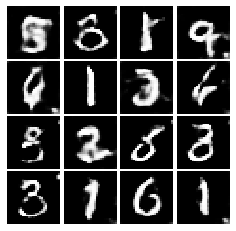

Epoch: 1, Iter: 860, D: 0.1625, G:0.1942


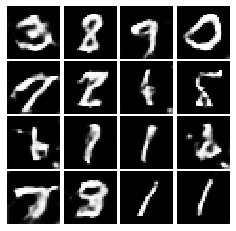

Epoch: 1, Iter: 880, D: 0.1132, G:0.3039


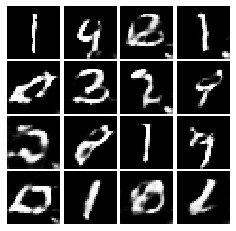

Epoch: 1, Iter: 900, D: 0.1354, G:0.3394


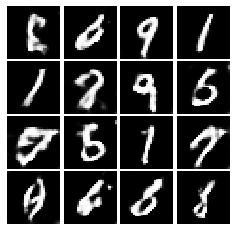

Epoch: 1, Iter: 920, D: 0.1583, G:0.2297


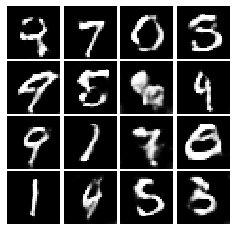

Epoch: 2, Iter: 940, D: 0.1452, G:0.2806


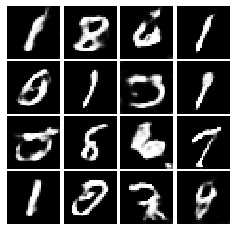

Epoch: 2, Iter: 960, D: 0.1475, G:0.2561


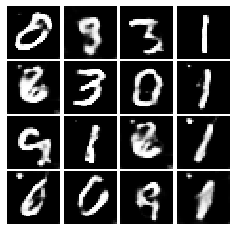

Epoch: 2, Iter: 980, D: 0.1495, G:0.2506


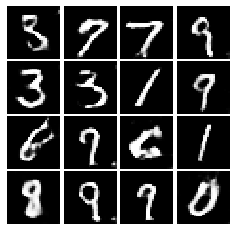

Epoch: 2, Iter: 1000, D: 0.1479, G:0.2232


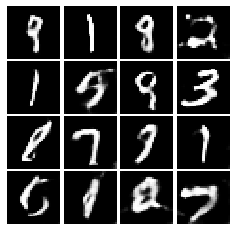

Epoch: 2, Iter: 1020, D: 0.1177, G:0.3235


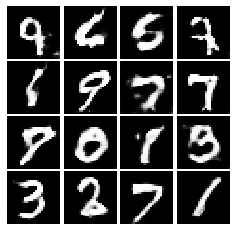

Epoch: 2, Iter: 1040, D: 0.1594, G:0.2521


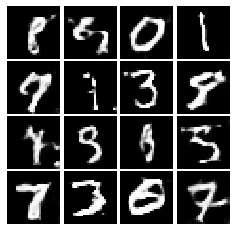

Epoch: 2, Iter: 1060, D: 0.1351, G:0.3673


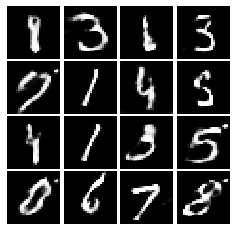

Epoch: 2, Iter: 1080, D: 0.21, G:0.1978


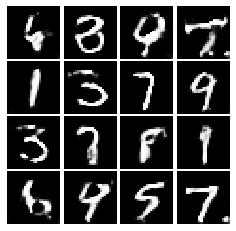

Epoch: 2, Iter: 1100, D: 0.1744, G:0.4181


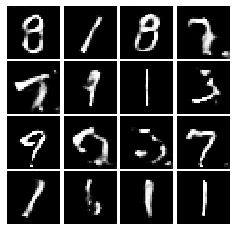

Epoch: 2, Iter: 1120, D: 0.1406, G:0.2609


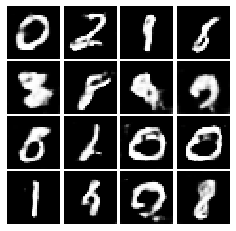

Epoch: 2, Iter: 1140, D: 0.1339, G:0.3514


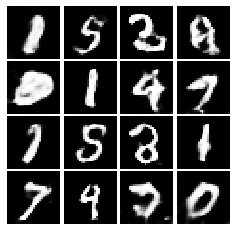

Epoch: 2, Iter: 1160, D: 0.1416, G:0.2702


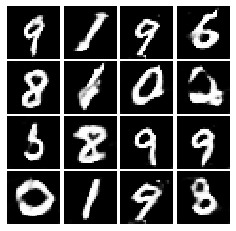

Epoch: 2, Iter: 1180, D: 0.144, G:0.2643


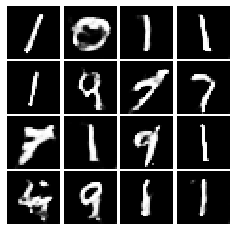

Epoch: 2, Iter: 1200, D: 0.1377, G:0.2174


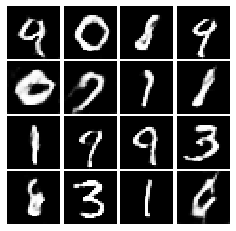

Epoch: 2, Iter: 1220, D: 0.1494, G:0.2573


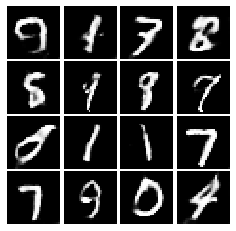

Epoch: 2, Iter: 1240, D: 0.1435, G:0.2431


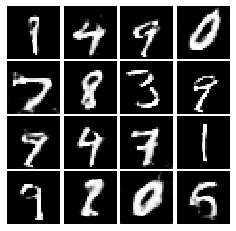

Epoch: 2, Iter: 1260, D: 0.1385, G:0.2521


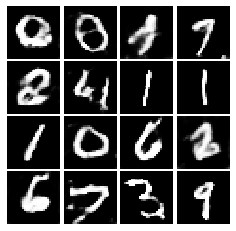

Epoch: 2, Iter: 1280, D: 0.1187, G:0.3344


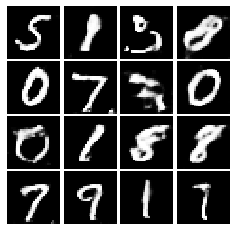

Epoch: 2, Iter: 1300, D: 0.1812, G:0.1824


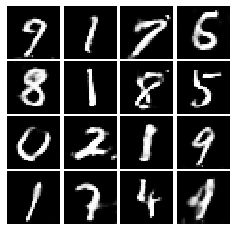

Epoch: 2, Iter: 1320, D: 0.1164, G:0.3048


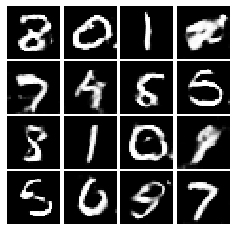

Epoch: 2, Iter: 1340, D: 0.16, G:0.2319


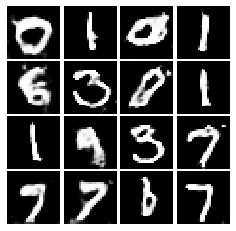

Epoch: 2, Iter: 1360, D: 0.1394, G:0.2634


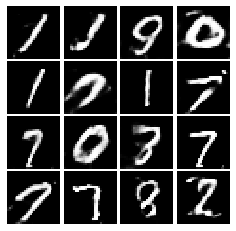

Epoch: 2, Iter: 1380, D: 0.1937, G:0.3892


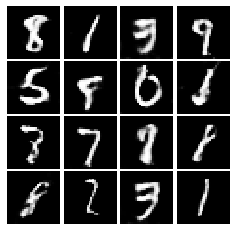

Epoch: 2, Iter: 1400, D: 0.1336, G:0.327


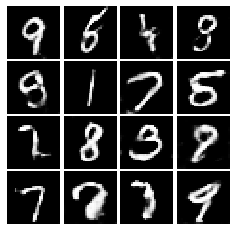

Epoch: 3, Iter: 1420, D: 0.1433, G:0.2824


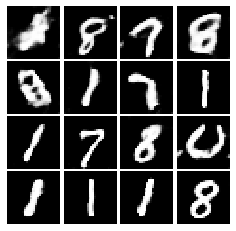

Epoch: 3, Iter: 1440, D: 0.127, G:0.2948


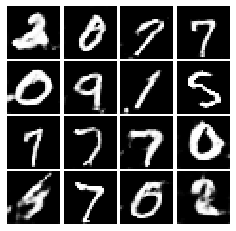

Epoch: 3, Iter: 1460, D: 0.2127, G:0.2557


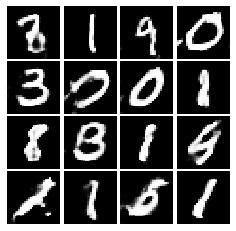

Epoch: 3, Iter: 1480, D: 0.1629, G:0.2601


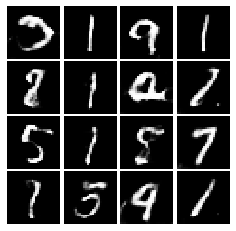

Epoch: 3, Iter: 1500, D: 0.1378, G:0.2935


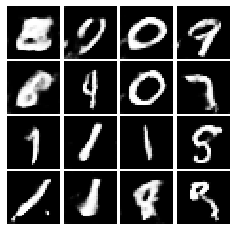

Epoch: 3, Iter: 1520, D: 0.1547, G:0.2675


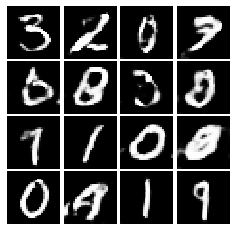

Epoch: 3, Iter: 1540, D: 0.1639, G:0.3361


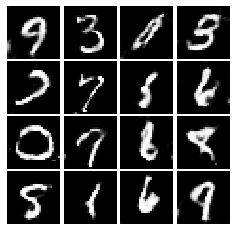

Epoch: 3, Iter: 1560, D: 0.131, G:0.2564


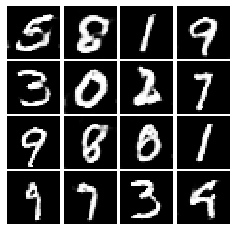

Epoch: 3, Iter: 1580, D: 0.1438, G:0.2851


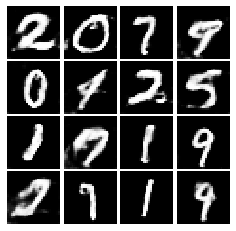

Epoch: 3, Iter: 1600, D: 0.1434, G:0.2949


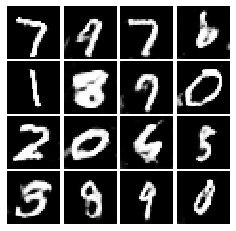

Epoch: 3, Iter: 1620, D: 0.1291, G:0.3526


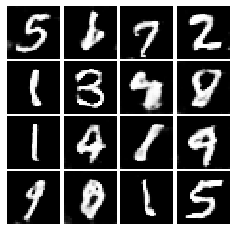

Epoch: 3, Iter: 1640, D: 0.1489, G:0.3171


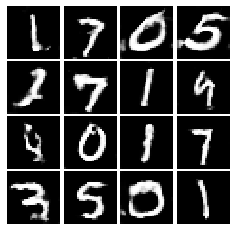

Epoch: 3, Iter: 1660, D: 0.1531, G:0.2413


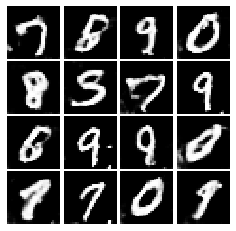

Epoch: 3, Iter: 1680, D: 0.1339, G:0.4325


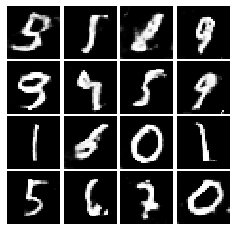

Epoch: 3, Iter: 1700, D: 0.0961, G:0.3275


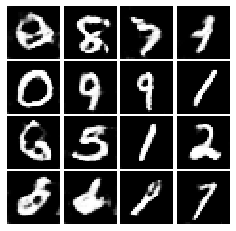

Epoch: 3, Iter: 1720, D: 0.2266, G:0.494


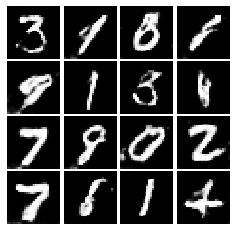

Epoch: 3, Iter: 1740, D: 0.155, G:0.2155


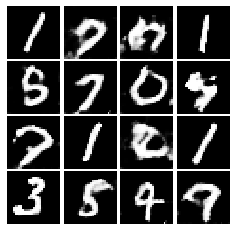

Epoch: 3, Iter: 1760, D: 0.124, G:0.2667


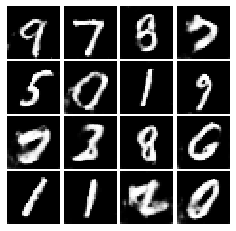

Epoch: 3, Iter: 1780, D: 0.1172, G:0.2028


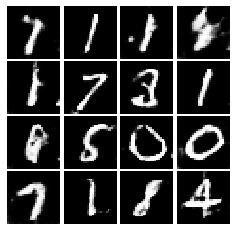

Epoch: 3, Iter: 1800, D: 0.2403, G:0.2286


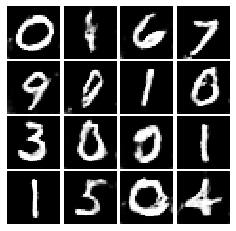

Epoch: 3, Iter: 1820, D: 0.1396, G:0.2701


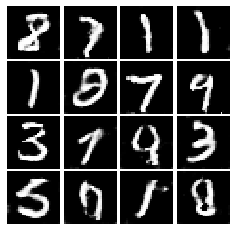

Epoch: 3, Iter: 1840, D: 0.1301, G:0.2442


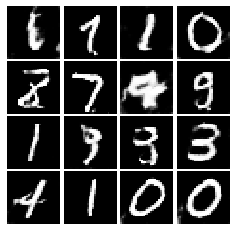

Epoch: 3, Iter: 1860, D: 0.1453, G:0.216


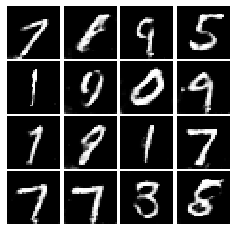

Epoch: 4, Iter: 1880, D: 0.1212, G:0.2998


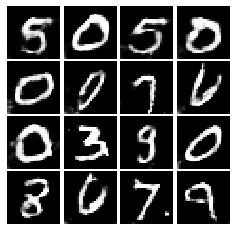

Epoch: 4, Iter: 1900, D: 0.132, G:0.2398


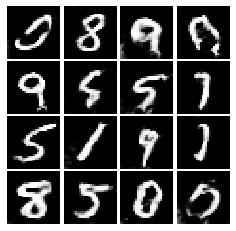

Epoch: 4, Iter: 1920, D: 0.1303, G:0.2479


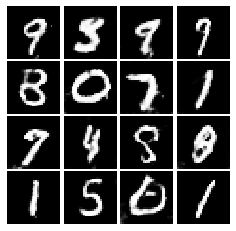

Epoch: 4, Iter: 1940, D: 0.1259, G:0.2932


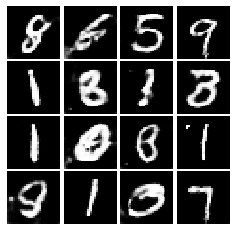

Epoch: 4, Iter: 1960, D: 0.1291, G:0.2903


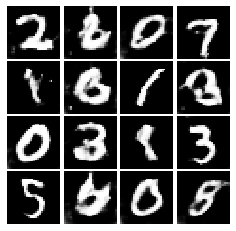

Epoch: 4, Iter: 1980, D: 0.1331, G:0.2418


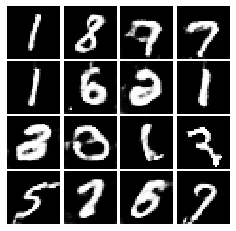

Epoch: 4, Iter: 2000, D: 0.1556, G:0.2002


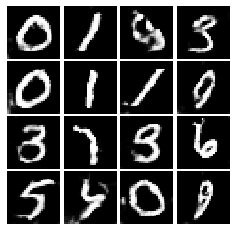

Epoch: 4, Iter: 2020, D: 0.1216, G:0.2898


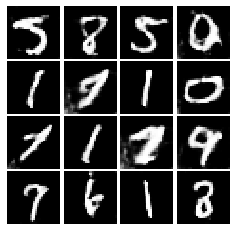

Epoch: 4, Iter: 2040, D: 0.143, G:0.2859


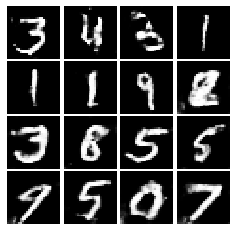

Epoch: 4, Iter: 2060, D: 0.09322, G:0.352


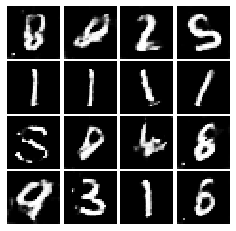

Epoch: 4, Iter: 2080, D: 0.1538, G:0.3341


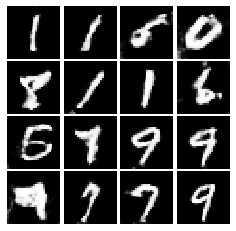

Epoch: 4, Iter: 2100, D: 0.1248, G:0.3109


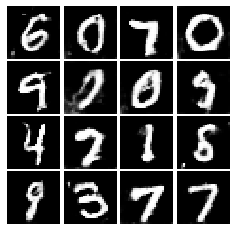

Epoch: 4, Iter: 2120, D: 0.1205, G:0.3344


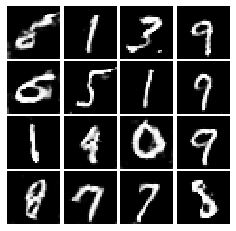

Epoch: 4, Iter: 2140, D: 0.1417, G:0.3284


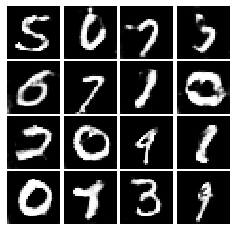

Epoch: 4, Iter: 2160, D: 0.1472, G:0.2241


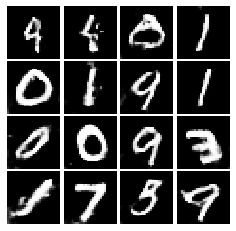

Epoch: 4, Iter: 2180, D: 0.1103, G:0.3069


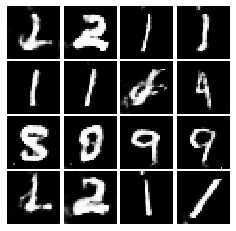

Epoch: 4, Iter: 2200, D: 0.166, G:0.2064


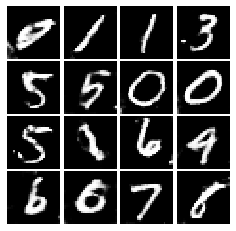

Epoch: 4, Iter: 2220, D: 0.1134, G:0.3216


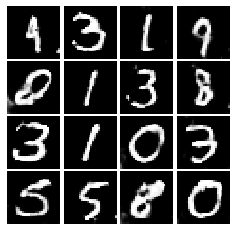

Epoch: 4, Iter: 2240, D: 0.1178, G:0.2981


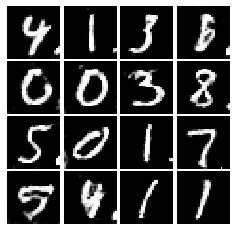

Epoch: 4, Iter: 2260, D: 0.1367, G:0.2855


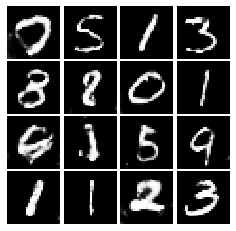

Epoch: 4, Iter: 2280, D: 0.1563, G:0.2571


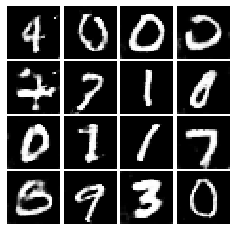

Epoch: 4, Iter: 2300, D: 0.1111, G:0.313


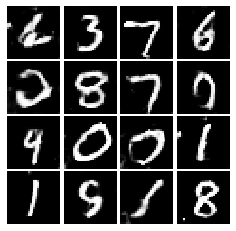

Epoch: 4, Iter: 2320, D: 0.141, G:0.3583


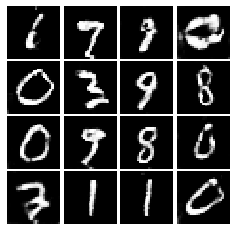

Epoch: 4, Iter: 2340, D: 0.1332, G:0.2692


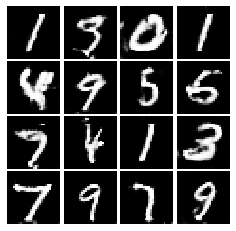

Epoch: 5, Iter: 2360, D: 0.1464, G:0.2745


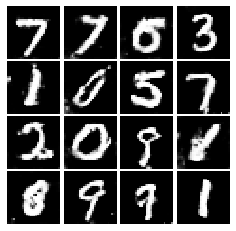

Epoch: 5, Iter: 2380, D: 0.1469, G:0.2866


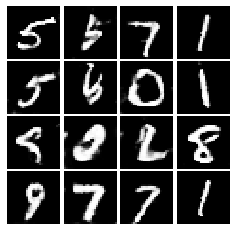

Epoch: 5, Iter: 2400, D: 0.1263, G:0.455


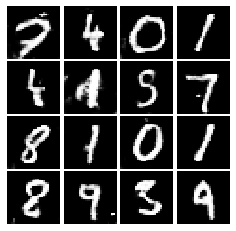

Epoch: 5, Iter: 2420, D: 0.1303, G:0.2393


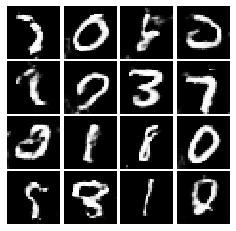

Epoch: 5, Iter: 2440, D: 0.1111, G:0.3153


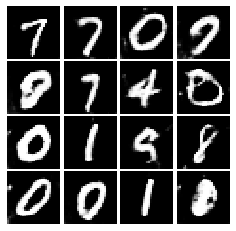

Epoch: 5, Iter: 2460, D: 0.1024, G:0.1964


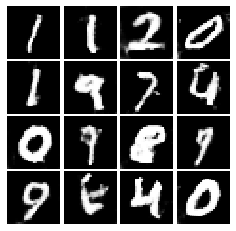

Epoch: 5, Iter: 2480, D: 0.1146, G:0.2363


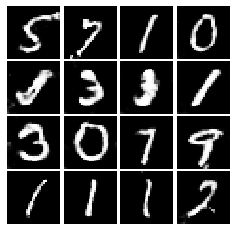

Epoch: 5, Iter: 2500, D: 0.1222, G:0.2347


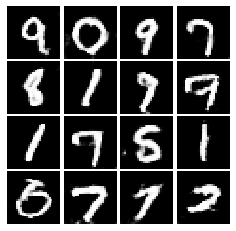

Epoch: 5, Iter: 2520, D: 0.1317, G:0.4107


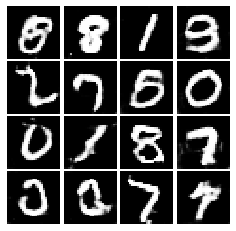

Epoch: 5, Iter: 2540, D: 0.1279, G:0.3444


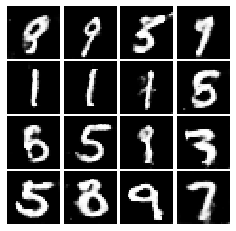

Epoch: 5, Iter: 2560, D: 0.1475, G:0.2002


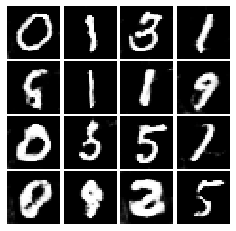

Epoch: 5, Iter: 2580, D: 0.1417, G:0.2142


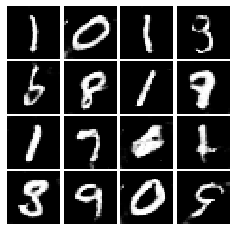

Epoch: 5, Iter: 2600, D: 0.1409, G:0.2426


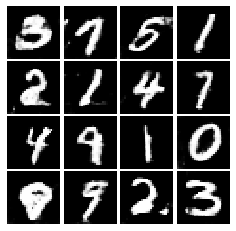

Epoch: 5, Iter: 2620, D: 0.1332, G:0.5587


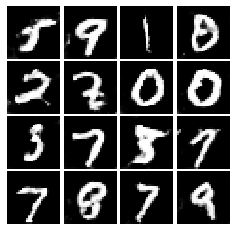

Epoch: 5, Iter: 2640, D: 0.1161, G:0.3467


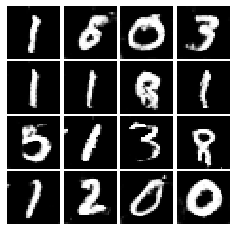

Epoch: 5, Iter: 2660, D: 0.1252, G:0.2638


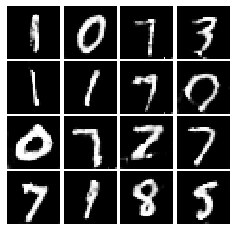

Epoch: 5, Iter: 2680, D: 0.07928, G:0.4146


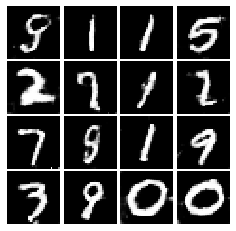

Epoch: 5, Iter: 2700, D: 0.11, G:0.439


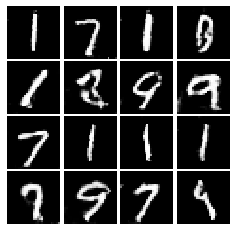

Epoch: 5, Iter: 2720, D: 0.151, G:0.1803


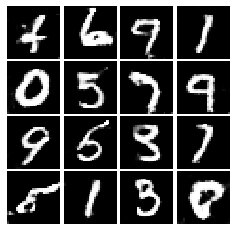

Epoch: 5, Iter: 2740, D: 0.1254, G:0.2764


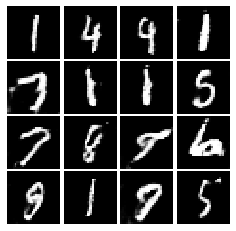

Epoch: 5, Iter: 2760, D: 0.1146, G:0.3058


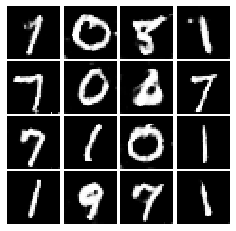

Epoch: 5, Iter: 2780, D: 0.1417, G:0.3946


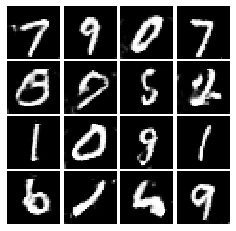

Epoch: 5, Iter: 2800, D: 0.1226, G:0.2606


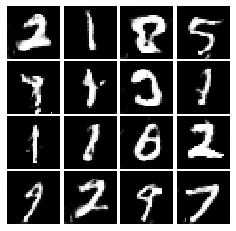

Epoch: 6, Iter: 2820, D: 0.1177, G:0.3488


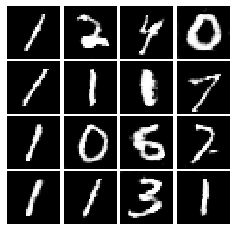

Epoch: 6, Iter: 2840, D: 0.1136, G:0.3459


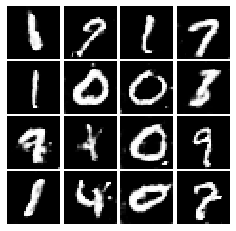

Epoch: 6, Iter: 2860, D: 0.1364, G:0.3082


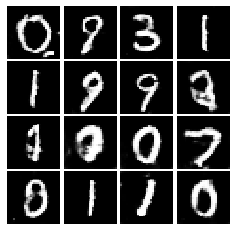

Epoch: 6, Iter: 2880, D: 0.1522, G:0.2524


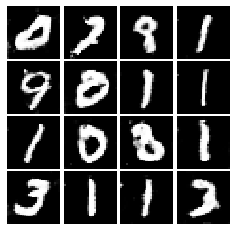

Epoch: 6, Iter: 2900, D: 0.1308, G:0.2464


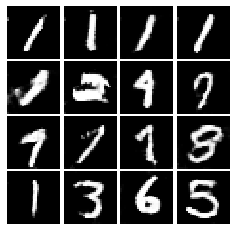

Epoch: 6, Iter: 2920, D: 0.1395, G:0.2776


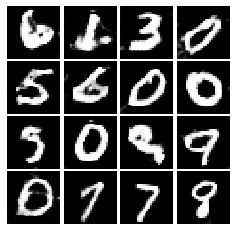

Epoch: 6, Iter: 2940, D: 0.1238, G:0.3044


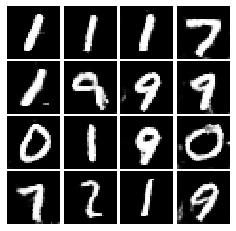

Epoch: 6, Iter: 2960, D: 0.1073, G:0.2919


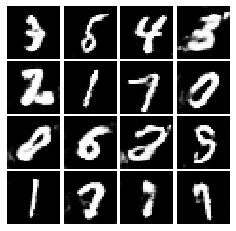

Epoch: 6, Iter: 2980, D: 0.1286, G:0.2636


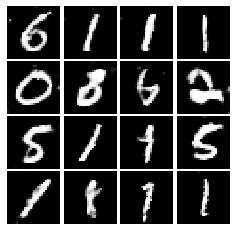

Epoch: 6, Iter: 3000, D: 0.1204, G:0.2278


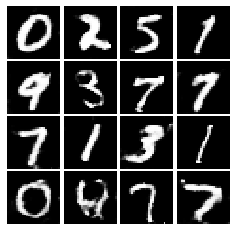

Epoch: 6, Iter: 3020, D: 0.1344, G:0.3088


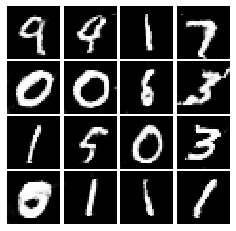

Epoch: 6, Iter: 3040, D: 0.08128, G:0.4052


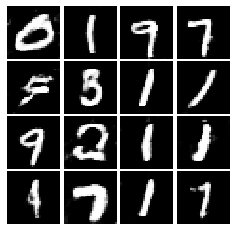

Epoch: 6, Iter: 3060, D: 0.1044, G:0.3545


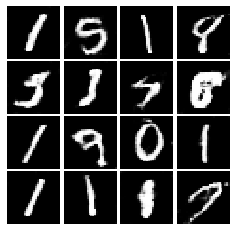

Epoch: 6, Iter: 3080, D: 0.0972, G:0.2989


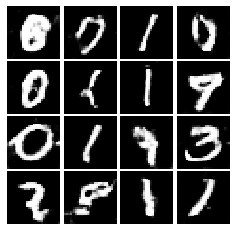

Epoch: 6, Iter: 3100, D: 0.1044, G:0.299


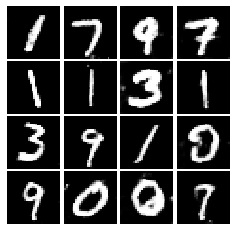

Epoch: 6, Iter: 3120, D: 0.1487, G:0.4032


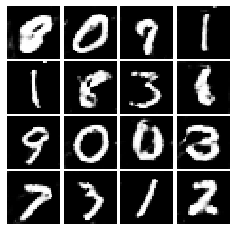

Epoch: 6, Iter: 3140, D: 0.1087, G:0.3232


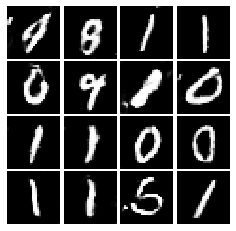

Epoch: 6, Iter: 3160, D: 0.09043, G:0.3172


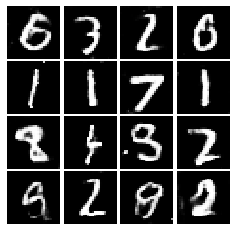

Epoch: 6, Iter: 3180, D: 0.1011, G:0.2694


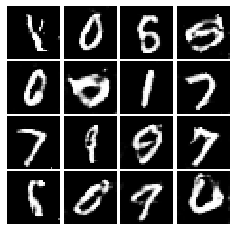

Epoch: 6, Iter: 3200, D: 0.1001, G:0.4159


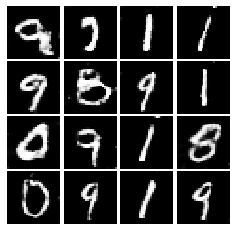

Epoch: 6, Iter: 3220, D: 0.1012, G:0.4337


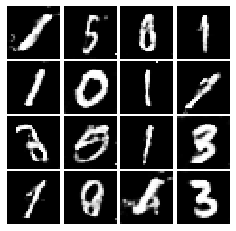

Epoch: 6, Iter: 3240, D: 0.1129, G:0.3317


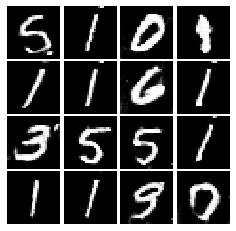

Epoch: 6, Iter: 3260, D: 0.1192, G:0.4185


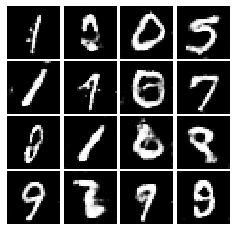

Epoch: 6, Iter: 3280, D: 0.1248, G:0.3338


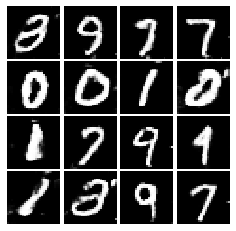

Epoch: 7, Iter: 3300, D: 0.07722, G:0.4135


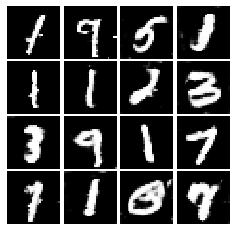

Epoch: 7, Iter: 3320, D: 0.09189, G:0.3607


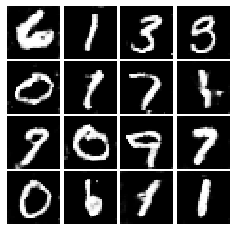

Epoch: 7, Iter: 3340, D: 0.1035, G:0.4222


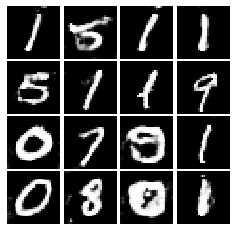

Epoch: 7, Iter: 3360, D: 0.1179, G:0.3491


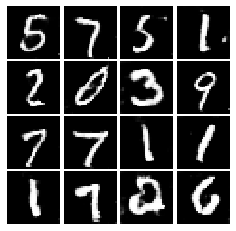

Epoch: 7, Iter: 3380, D: 0.1074, G:0.4602


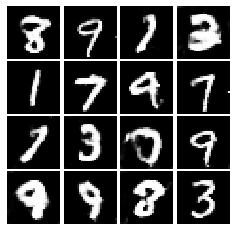

Epoch: 7, Iter: 3400, D: 0.1252, G:0.4524


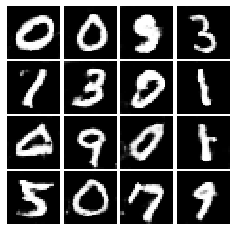

Epoch: 7, Iter: 3420, D: 0.12, G:0.3111


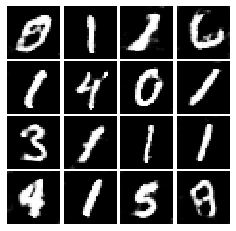

Epoch: 7, Iter: 3440, D: 0.09672, G:0.3431


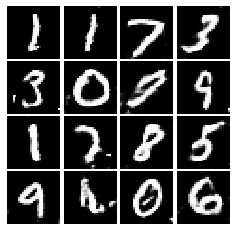

Epoch: 7, Iter: 3460, D: 0.1186, G:0.255


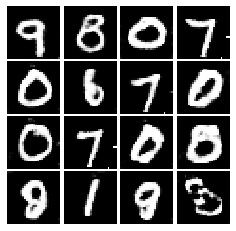

Epoch: 7, Iter: 3480, D: 0.1459, G:0.2483


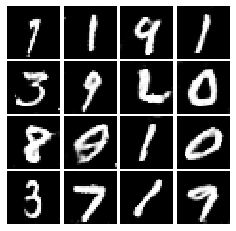

Epoch: 7, Iter: 3500, D: 0.09287, G:0.3762


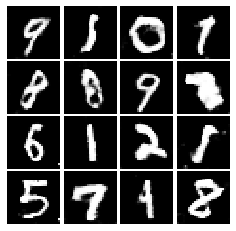

Epoch: 7, Iter: 3520, D: 0.1023, G:0.3942


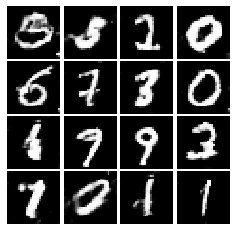

Epoch: 7, Iter: 3540, D: 0.1101, G:0.4155


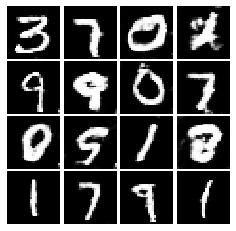

Epoch: 7, Iter: 3560, D: 0.08943, G:0.3658


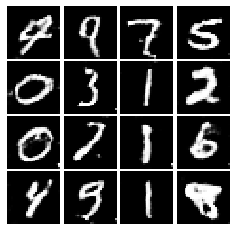

Epoch: 7, Iter: 3580, D: 0.144, G:0.1686


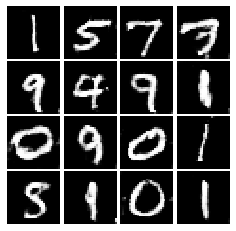

Epoch: 7, Iter: 3600, D: 0.1118, G:0.424


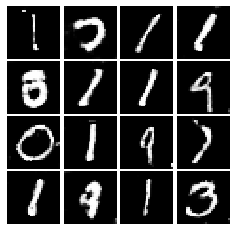

Epoch: 7, Iter: 3620, D: 0.1165, G:0.4577


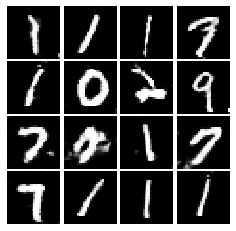

Epoch: 7, Iter: 3640, D: 0.1293, G:0.2683


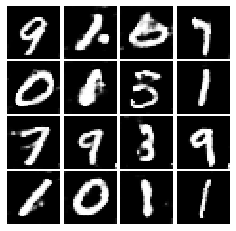

Epoch: 7, Iter: 3660, D: 0.1057, G:0.3201


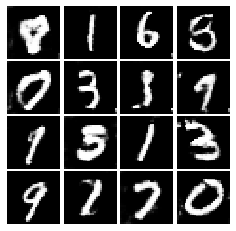

Epoch: 7, Iter: 3680, D: 0.1264, G:0.3409


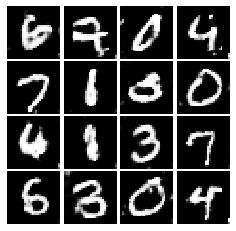

Epoch: 7, Iter: 3700, D: 0.1047, G:0.2435


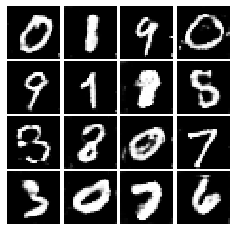

Epoch: 7, Iter: 3720, D: 0.09719, G:0.3495


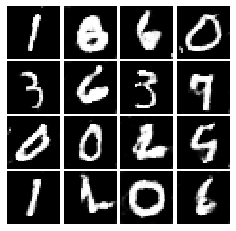

Epoch: 7, Iter: 3740, D: 0.1219, G:0.3534


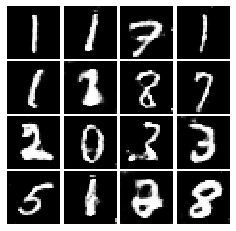

Epoch: 8, Iter: 3760, D: 0.09859, G:0.2744


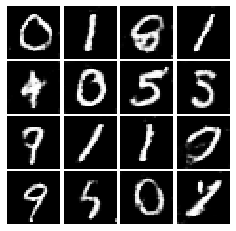

Epoch: 8, Iter: 3780, D: 0.1075, G:0.3158


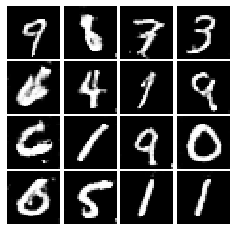

Epoch: 8, Iter: 3800, D: 0.09623, G:0.2773


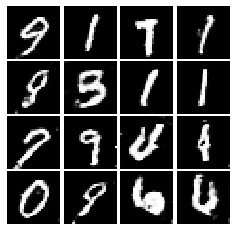

Epoch: 8, Iter: 3820, D: 0.1192, G:0.284


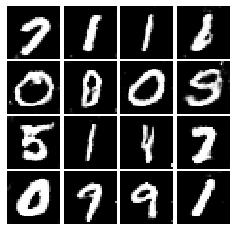

Epoch: 8, Iter: 3840, D: 0.115, G:0.3737


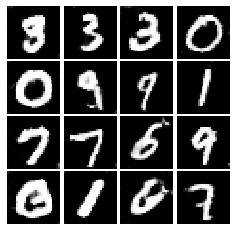

Epoch: 8, Iter: 3860, D: 0.09703, G:0.3972


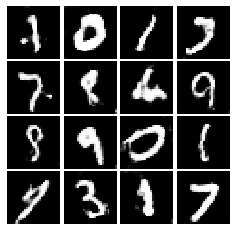

Epoch: 8, Iter: 3880, D: 0.1055, G:0.2886


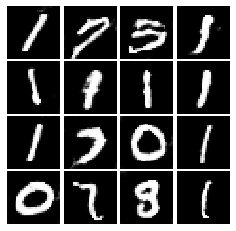

Epoch: 8, Iter: 3900, D: 0.09511, G:0.325


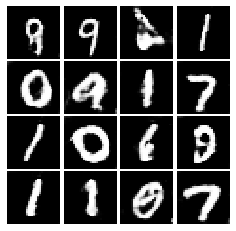

Epoch: 8, Iter: 3920, D: 0.1211, G:0.2084


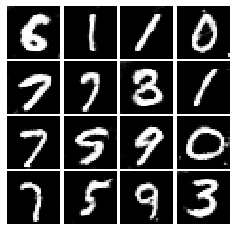

Epoch: 8, Iter: 3940, D: 0.1134, G:0.3408


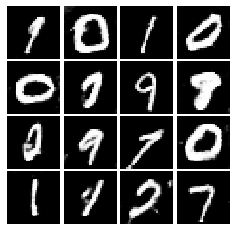

Epoch: 8, Iter: 3960, D: 0.09897, G:0.2794


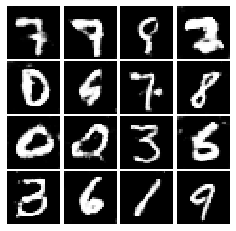

Epoch: 8, Iter: 3980, D: 0.1281, G:0.2474


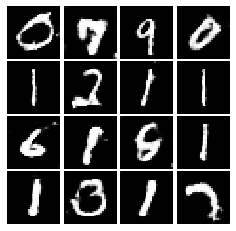

Epoch: 8, Iter: 4000, D: 0.1018, G:0.227


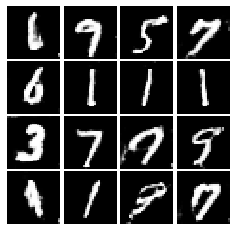

Epoch: 8, Iter: 4020, D: 0.1002, G:0.3126


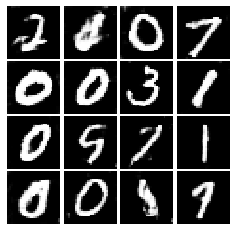

Epoch: 8, Iter: 4040, D: 0.1376, G:0.4602


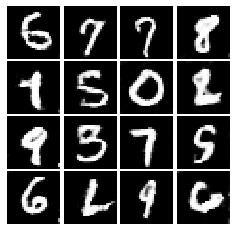

Epoch: 8, Iter: 4060, D: 0.09529, G:0.3355


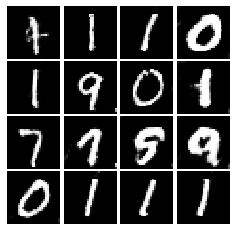

Epoch: 8, Iter: 4080, D: 0.1094, G:0.274


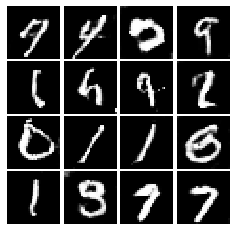

Epoch: 8, Iter: 4100, D: 0.09766, G:0.3453


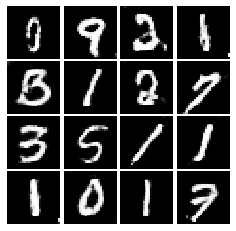

Epoch: 8, Iter: 4120, D: 0.095, G:0.3695


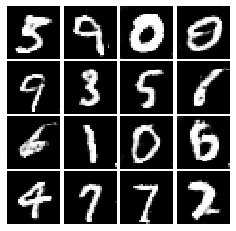

Epoch: 8, Iter: 4140, D: 0.08257, G:0.3118


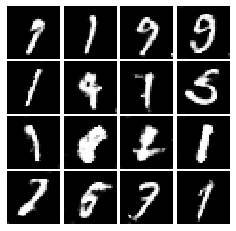

Epoch: 8, Iter: 4160, D: 0.09189, G:0.2713


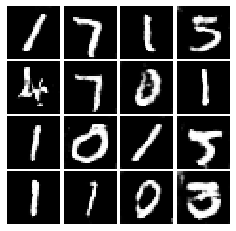

Epoch: 8, Iter: 4180, D: 0.1029, G:0.2711


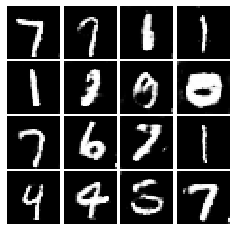

Epoch: 8, Iter: 4200, D: 0.1119, G:0.257


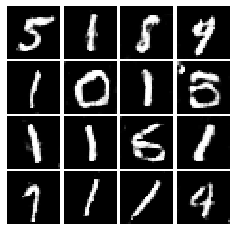

Epoch: 8, Iter: 4220, D: 0.0643, G:0.4392


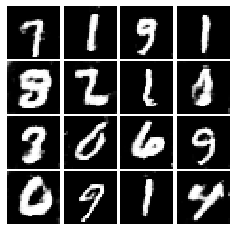

Epoch: 9, Iter: 4240, D: 0.09427, G:0.4152


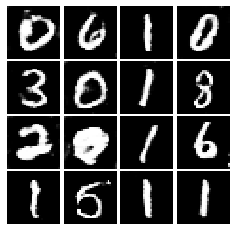

Epoch: 9, Iter: 4260, D: 0.1038, G:0.3641


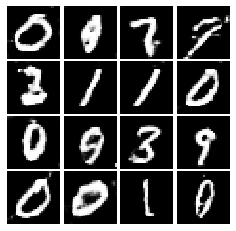

Epoch: 9, Iter: 4280, D: 0.09278, G:0.3657


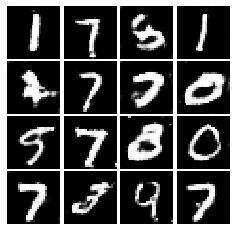

Epoch: 9, Iter: 4300, D: 0.1188, G:0.3584


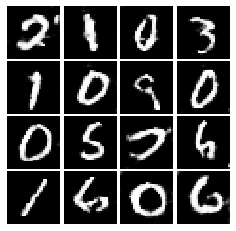

Epoch: 9, Iter: 4320, D: 0.1188, G:0.3559


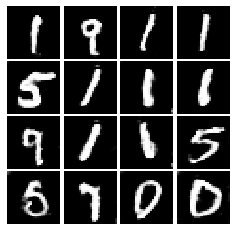

Epoch: 9, Iter: 4340, D: 0.0951, G:0.3095


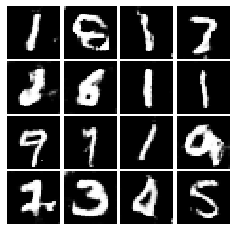

Epoch: 9, Iter: 4360, D: 0.1039, G:0.3475


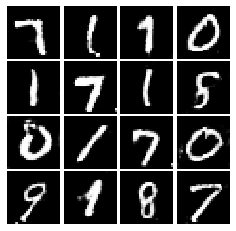

Epoch: 9, Iter: 4380, D: 0.09426, G:0.4582


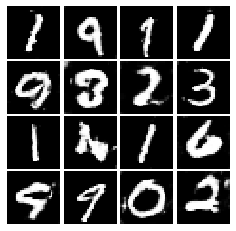

Epoch: 9, Iter: 4400, D: 0.09606, G:0.3558


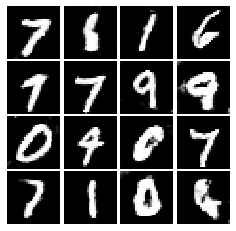

Epoch: 9, Iter: 4420, D: 0.0917, G:0.3757


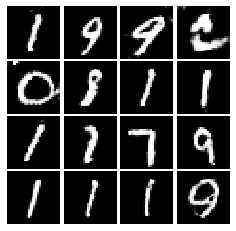

Epoch: 9, Iter: 4440, D: 0.1237, G:0.3334


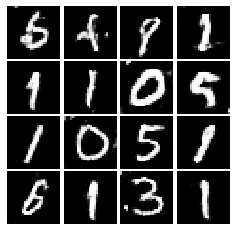

Epoch: 9, Iter: 4460, D: 0.07349, G:0.4408


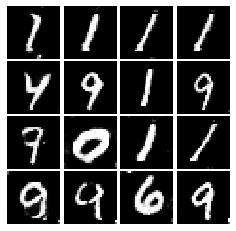

Epoch: 9, Iter: 4480, D: 0.08867, G:0.35


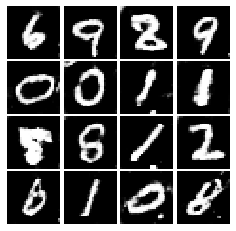

Epoch: 9, Iter: 4500, D: 0.09588, G:0.3384


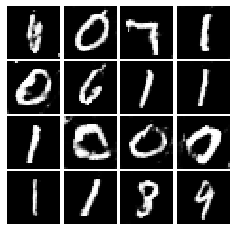

Epoch: 9, Iter: 4520, D: 0.08403, G:0.4526


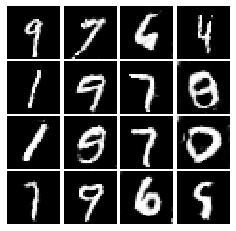

Epoch: 9, Iter: 4540, D: 0.09574, G:0.2862


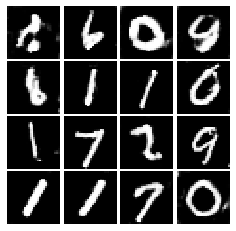

Epoch: 9, Iter: 4560, D: 0.1135, G:0.6028


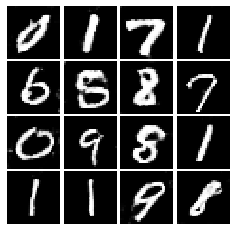

Epoch: 9, Iter: 4580, D: 0.08988, G:0.3948


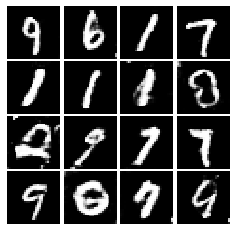

Epoch: 9, Iter: 4600, D: 0.1162, G:0.442


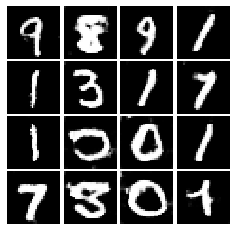

Epoch: 9, Iter: 4620, D: 0.1121, G:0.2549


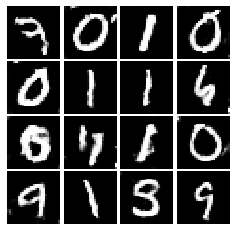

Epoch: 9, Iter: 4640, D: 0.05729, G:0.3851


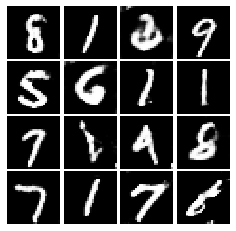

Epoch: 9, Iter: 4660, D: 0.08008, G:0.3394


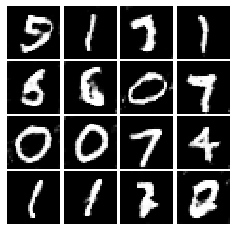

Epoch: 9, Iter: 4680, D: 0.07984, G:0.4286


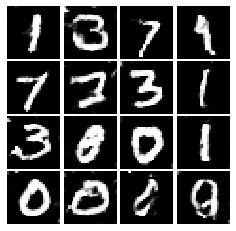

Final images


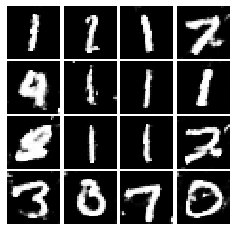

In [24]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [19]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Reshape((28,28,1,), input_shape=(784,)),
        tf.keras.layers.Conv2D(32, (5,5), (1,1)),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D(),
        tf.keras.layers.Conv2D(64, (5,5), (1,1)),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D(),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [20]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture"
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, input_shape=(noise_dim,)),
        tf.keras.layers.ReLU(),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(7*7*128),
        tf.keras.layers.ReLU(),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Reshape((7,7,128)),
        tf.keras.layers.Conv2DTranspose(64, (4,4), (2,2), padding="same"),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2DTranspose(1, (4,4), (2,2), padding="same", activation=tf.nn.tanh)
 
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.374, G:0.6497


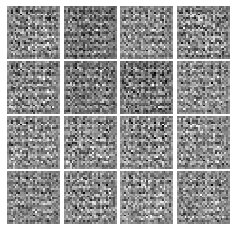

Epoch: 0, Iter: 20, D: 0.5913, G:1.344


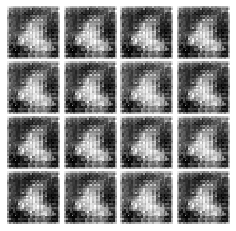

Epoch: 0, Iter: 40, D: 0.1691, G:3.413


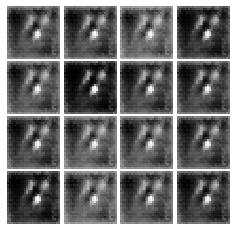

Epoch: 0, Iter: 60, D: 1.035, G:1.472


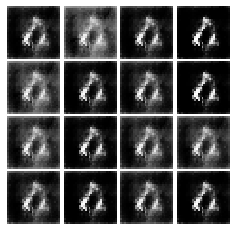

Epoch: 0, Iter: 80, D: 0.471, G:2.64


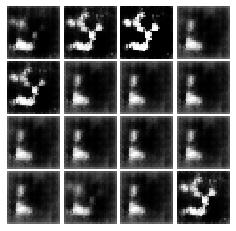

Epoch: 0, Iter: 100, D: 0.6405, G:1.789


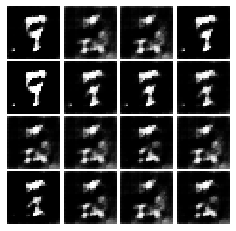

Epoch: 0, Iter: 120, D: 0.6319, G:2.782


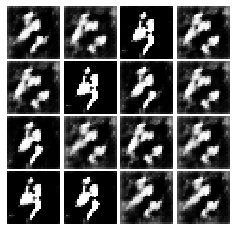

Epoch: 0, Iter: 140, D: 0.8928, G:1.842


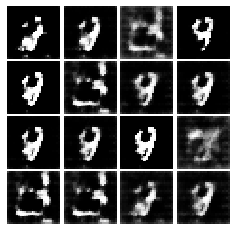

Epoch: 0, Iter: 160, D: 0.8218, G:1.983


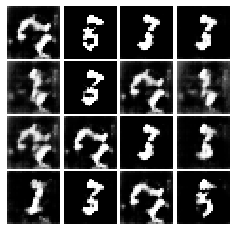

Epoch: 0, Iter: 180, D: 1.997, G:1.154


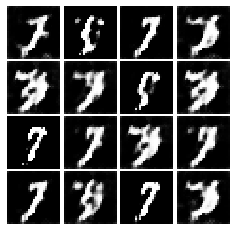

Epoch: 0, Iter: 200, D: 0.5951, G:4.32


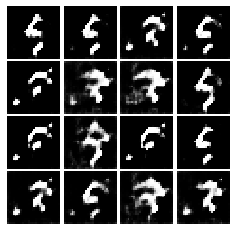

Epoch: 0, Iter: 220, D: 0.948, G:1.18


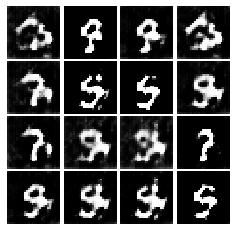

Epoch: 0, Iter: 240, D: 0.7996, G:1.785


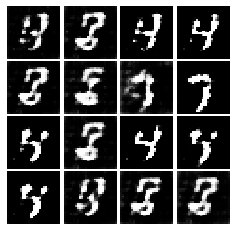

Epoch: 0, Iter: 260, D: 1.131, G:1.974


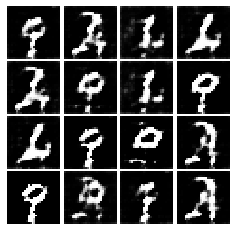

Epoch: 0, Iter: 280, D: 1.421, G:1.34


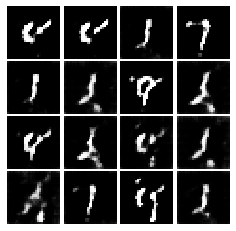

Epoch: 0, Iter: 300, D: 0.5572, G:3.088


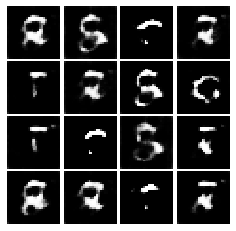

Epoch: 0, Iter: 320, D: 0.5079, G:3.283


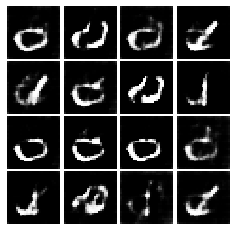

Epoch: 0, Iter: 340, D: 0.6265, G:2.354


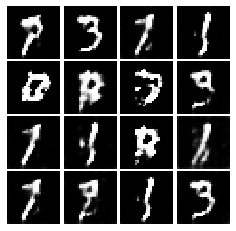

Epoch: 0, Iter: 360, D: 0.6417, G:2.533


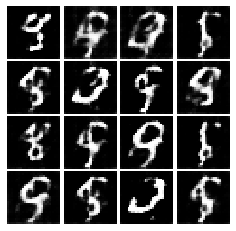

Epoch: 0, Iter: 380, D: 0.6996, G:1.925


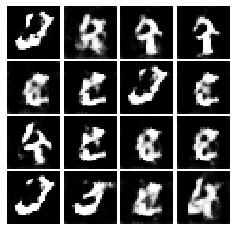

Epoch: 0, Iter: 400, D: 0.8874, G:2.893


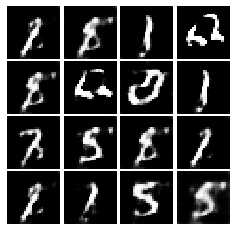

Epoch: 0, Iter: 420, D: 0.647, G:2.976


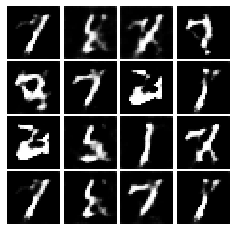

Epoch: 0, Iter: 440, D: 0.7556, G:1.171


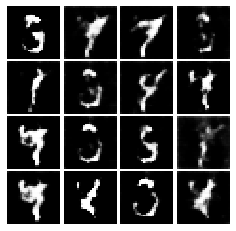

Epoch: 0, Iter: 460, D: 0.4415, G:2.308


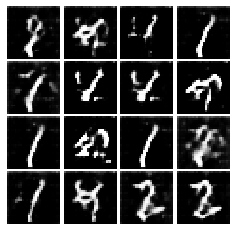

Epoch: 1, Iter: 480, D: 0.7022, G:2.925


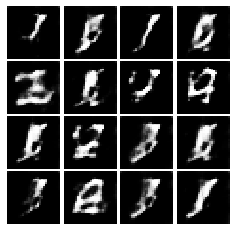

Epoch: 1, Iter: 500, D: 0.5458, G:1.778


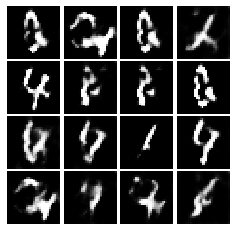

Epoch: 1, Iter: 520, D: 0.4618, G:2.108


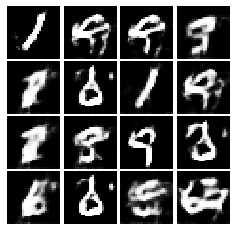

Epoch: 1, Iter: 540, D: 0.5274, G:1.422


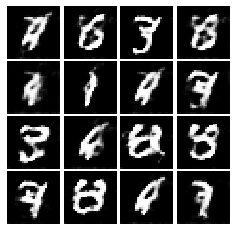

Epoch: 1, Iter: 560, D: 0.7729, G:2.232


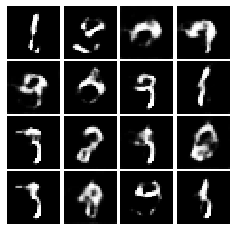

Epoch: 1, Iter: 580, D: 0.6782, G:1.541


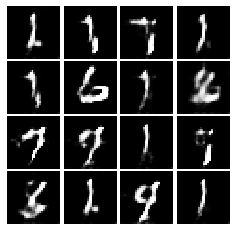

Epoch: 1, Iter: 600, D: 0.5418, G:2.37


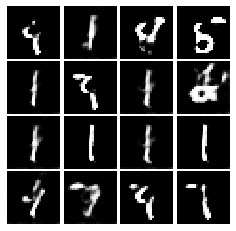

Epoch: 1, Iter: 620, D: 0.6989, G:2.068


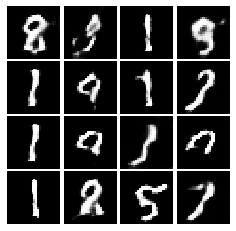

Epoch: 1, Iter: 640, D: 1.484, G:3.97


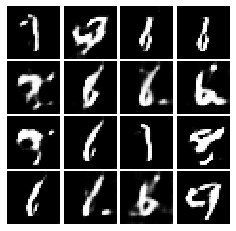

Epoch: 1, Iter: 660, D: 0.4905, G:1.953


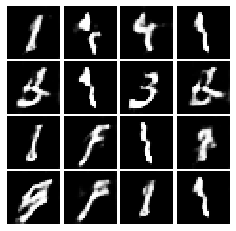

Epoch: 1, Iter: 680, D: 0.6904, G:2.207


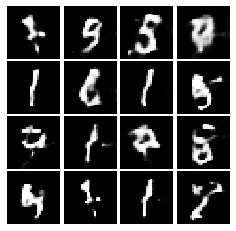

Epoch: 1, Iter: 700, D: 0.8163, G:1.729


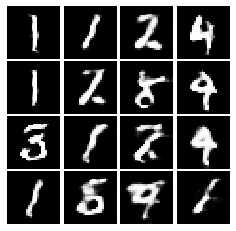

Epoch: 1, Iter: 720, D: 0.6784, G:1.925


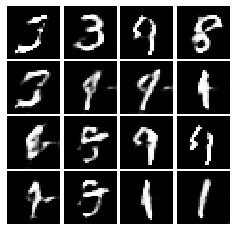

Epoch: 1, Iter: 740, D: 0.748, G:2.739


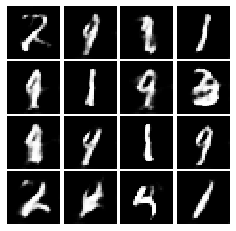

Epoch: 1, Iter: 760, D: 0.6125, G:2.074


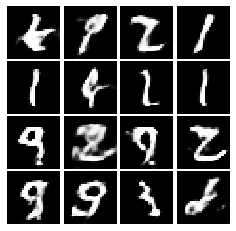

Epoch: 1, Iter: 780, D: 0.7358, G:1.88


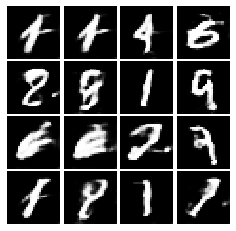

Epoch: 1, Iter: 800, D: 0.7321, G:1.686


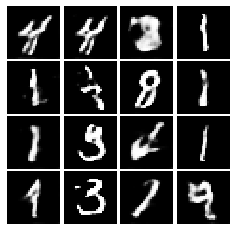

Epoch: 1, Iter: 820, D: 0.7298, G:1.472


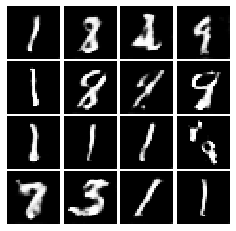

Epoch: 1, Iter: 840, D: 0.7248, G:2.109


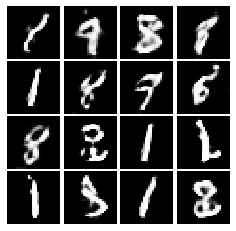

Epoch: 1, Iter: 860, D: 0.6246, G:2.132


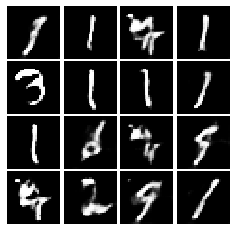

Epoch: 1, Iter: 880, D: 0.4926, G:1.782


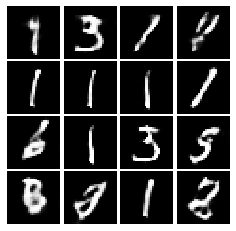

Epoch: 1, Iter: 900, D: 0.583, G:2.292


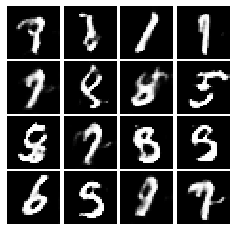

Epoch: 1, Iter: 920, D: 0.5454, G:1.824


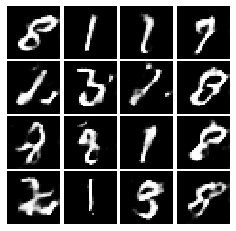

Epoch: 2, Iter: 940, D: 0.6076, G:2.259


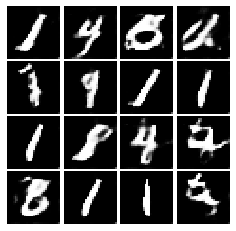

Epoch: 2, Iter: 960, D: 0.7284, G:1.724


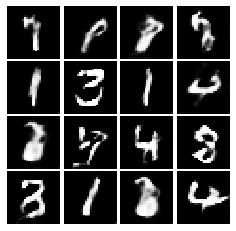

Epoch: 2, Iter: 980, D: 0.6514, G:1.713


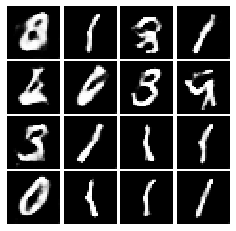

Epoch: 2, Iter: 1000, D: 0.7565, G:1.65


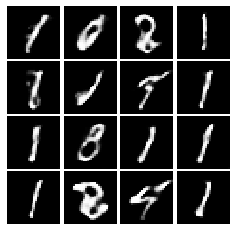

Epoch: 2, Iter: 1020, D: 0.7451, G:2.546


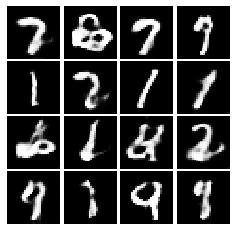

Epoch: 2, Iter: 1040, D: 0.8896, G:2.144


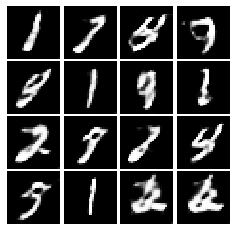

Epoch: 2, Iter: 1060, D: 0.6581, G:2.16


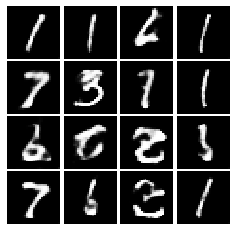

Epoch: 2, Iter: 1080, D: 0.8601, G:0.9586


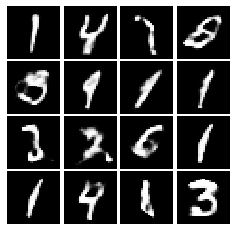

Epoch: 2, Iter: 1100, D: 0.7304, G:1.963


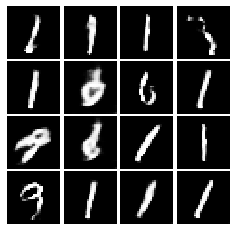

Epoch: 2, Iter: 1120, D: 0.7702, G:1.654


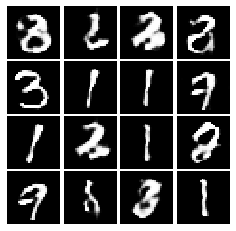

Epoch: 2, Iter: 1140, D: 0.632, G:1.868


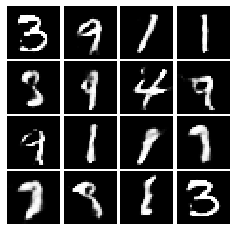

Epoch: 2, Iter: 1160, D: 0.8112, G:1.536


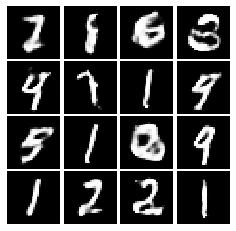

Epoch: 2, Iter: 1180, D: 0.8179, G:1.498


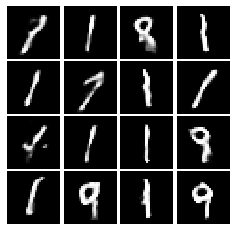

Epoch: 2, Iter: 1200, D: 0.7518, G:1.699


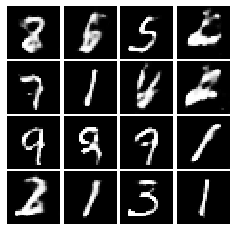

Epoch: 2, Iter: 1220, D: 0.8529, G:0.9235


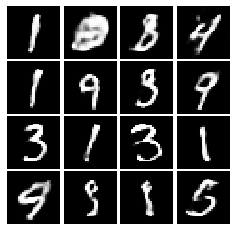

Epoch: 2, Iter: 1240, D: 0.6605, G:1.659


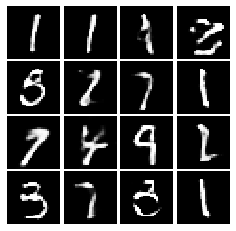

Epoch: 2, Iter: 1260, D: 0.6571, G:1.757


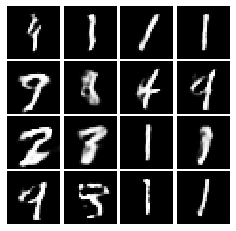

Epoch: 2, Iter: 1280, D: 0.7954, G:2.221


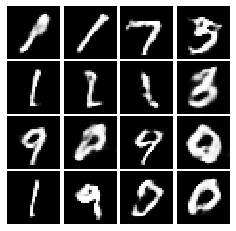

Epoch: 2, Iter: 1300, D: 0.6751, G:1.393


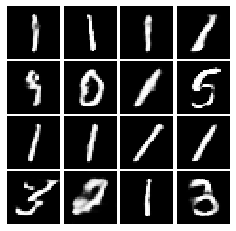

Epoch: 2, Iter: 1320, D: 0.8409, G:2.098


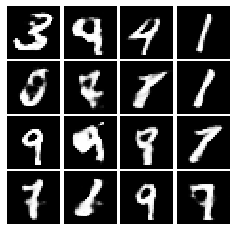

Epoch: 2, Iter: 1340, D: 0.7686, G:1.753


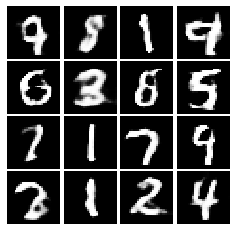

Epoch: 2, Iter: 1360, D: 0.621, G:1.885


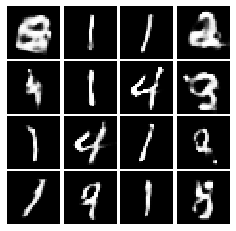

Epoch: 2, Iter: 1380, D: 0.7537, G:1.443


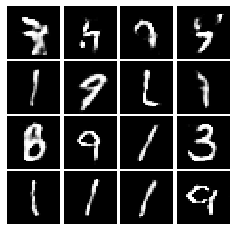

Epoch: 2, Iter: 1400, D: 0.8207, G:1.463


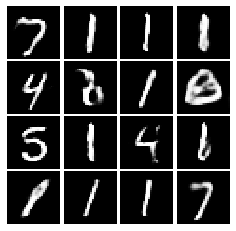

Epoch: 3, Iter: 1420, D: 0.7793, G:1.228


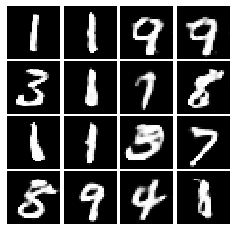

Epoch: 3, Iter: 1440, D: 0.7217, G:1.675


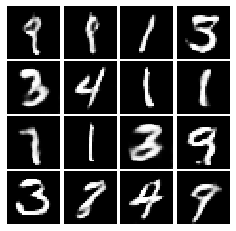

Epoch: 3, Iter: 1460, D: 0.7415, G:1.442


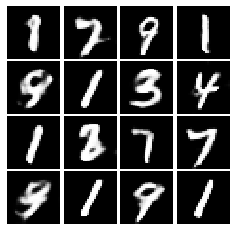

Epoch: 3, Iter: 1480, D: 0.8494, G:1.405


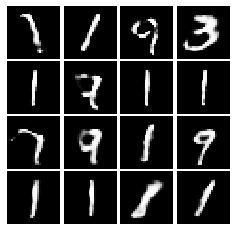

Epoch: 3, Iter: 1500, D: 0.7693, G:1.677


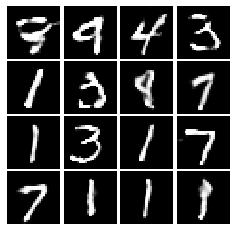

Epoch: 3, Iter: 1520, D: 0.7868, G:1.56


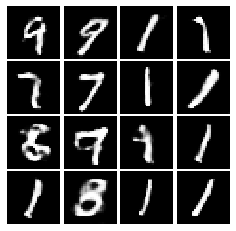

Epoch: 3, Iter: 1540, D: 1.075, G:2.278


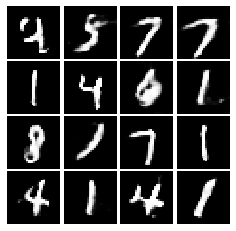

Epoch: 3, Iter: 1560, D: 0.8776, G:1.478


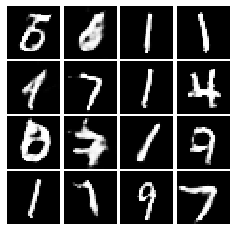

Epoch: 3, Iter: 1580, D: 0.7649, G:1.646


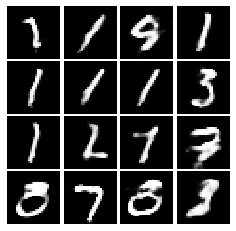

Epoch: 3, Iter: 1600, D: 0.7749, G:1.577


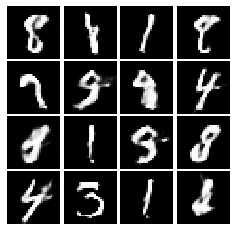

Epoch: 3, Iter: 1620, D: 0.6564, G:2.05


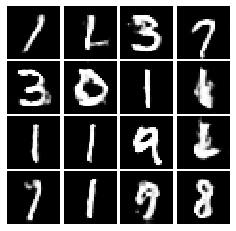

Epoch: 3, Iter: 1640, D: 0.6173, G:1.556


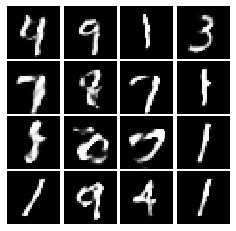

Epoch: 3, Iter: 1660, D: 0.7597, G:1.724


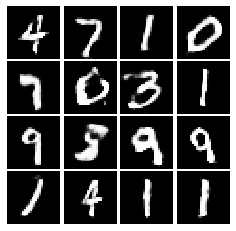

Epoch: 3, Iter: 1680, D: 0.7553, G:1.452


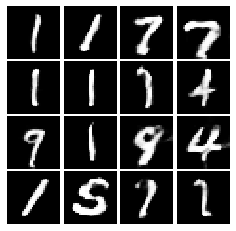

Epoch: 3, Iter: 1700, D: 0.7159, G:2.193


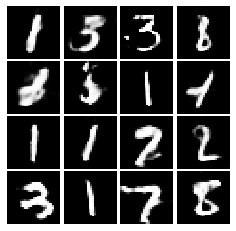

Epoch: 3, Iter: 1720, D: 0.8148, G:1.448


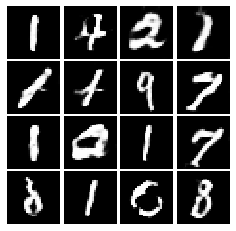

Epoch: 3, Iter: 1740, D: 0.803, G:1.731


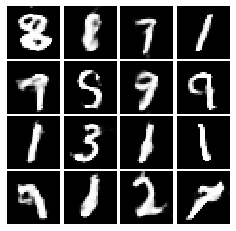

Epoch: 3, Iter: 1760, D: 0.768, G:1.523


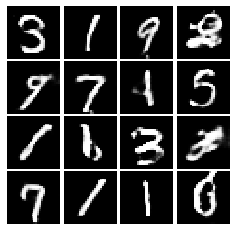

Epoch: 3, Iter: 1780, D: 0.8426, G:2.108


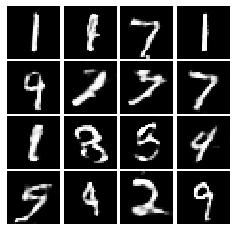

Epoch: 3, Iter: 1800, D: 1.187, G:0.9004


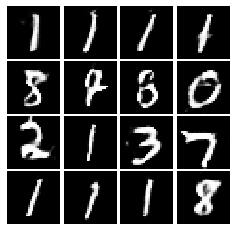

Epoch: 3, Iter: 1820, D: 0.7956, G:1.239


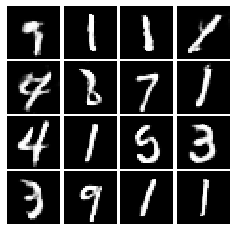

Epoch: 3, Iter: 1840, D: 0.7541, G:1.384


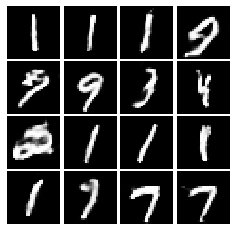

Epoch: 3, Iter: 1860, D: 0.8015, G:1.217


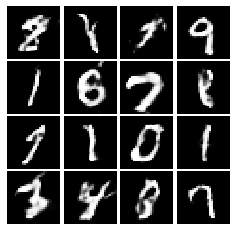

Epoch: 4, Iter: 1880, D: 0.7238, G:1.583


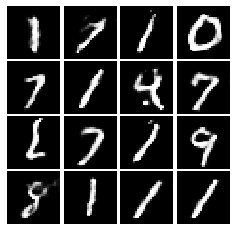

Epoch: 4, Iter: 1900, D: 0.7253, G:1.341


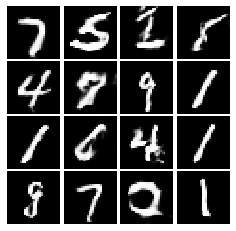

Epoch: 4, Iter: 1920, D: 0.6676, G:1.638


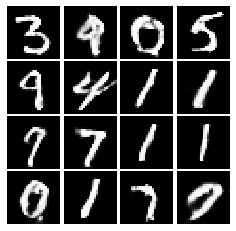

Epoch: 4, Iter: 1940, D: 0.7657, G:1.676


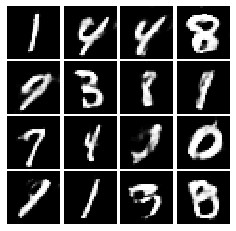

Epoch: 4, Iter: 1960, D: 0.7989, G:1.342


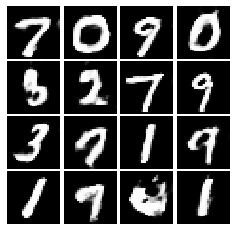

Epoch: 4, Iter: 1980, D: 0.7118, G:1.731


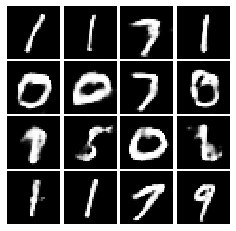

Epoch: 4, Iter: 2000, D: 1.135, G:1.032


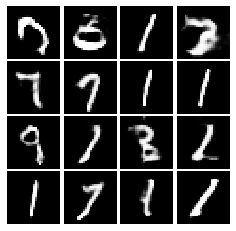

Epoch: 4, Iter: 2020, D: 0.7258, G:1.641


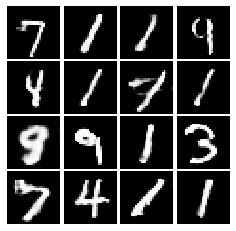

Epoch: 4, Iter: 2040, D: 0.7614, G:1.658


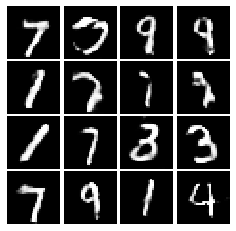

Epoch: 4, Iter: 2060, D: 0.6574, G:1.692


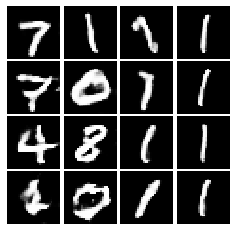

Epoch: 4, Iter: 2080, D: 0.9251, G:1.682


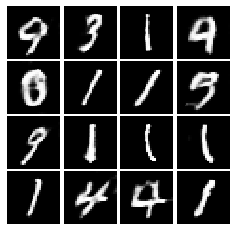

Epoch: 4, Iter: 2100, D: 0.8252, G:1.427


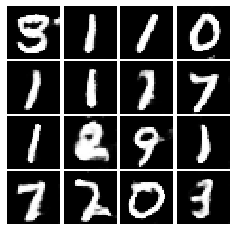

Epoch: 4, Iter: 2120, D: 1.02, G:1.359


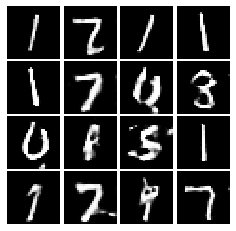

Epoch: 4, Iter: 2140, D: 1.039, G:1.339


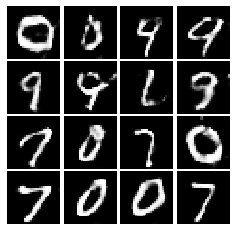

Epoch: 4, Iter: 2160, D: 0.9009, G:1.681


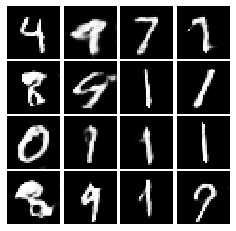

Epoch: 4, Iter: 2180, D: 0.6923, G:1.576


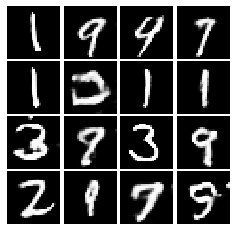

Epoch: 4, Iter: 2200, D: 0.7232, G:1.619


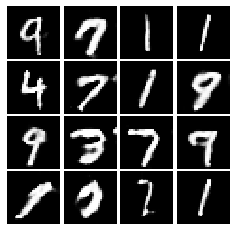

Epoch: 4, Iter: 2220, D: 0.6732, G:1.71


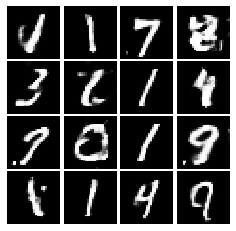

Epoch: 4, Iter: 2240, D: 0.728, G:1.688


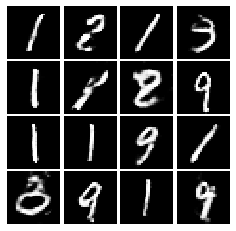

Epoch: 4, Iter: 2260, D: 0.7319, G:1.995


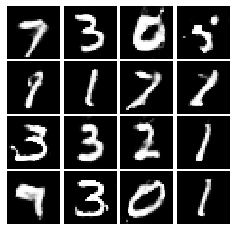

Epoch: 4, Iter: 2280, D: 0.6643, G:1.729


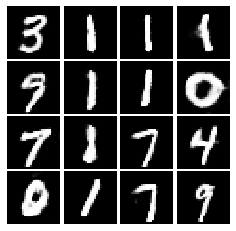

Epoch: 4, Iter: 2300, D: 0.7354, G:1.494


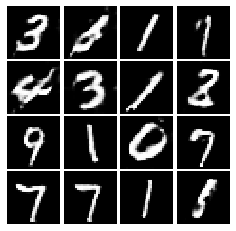

Epoch: 4, Iter: 2320, D: 0.7548, G:2.652


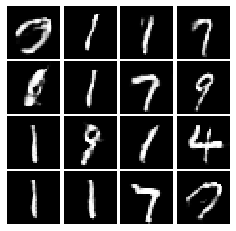

Epoch: 4, Iter: 2340, D: 0.979, G:1.876


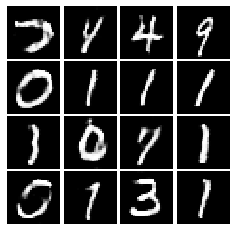

Final images


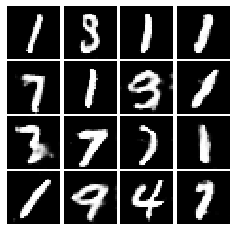

In [21]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2   |   1   |  -1   |  -2   |  -1   |   1    
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |  -1   |  -2   |  -1   |   1   |   2   |   1    
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer:  ###
No, since the pattern will repeat itself over and over again.


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer:  ###
No, it means that the generator is learning well, while the discriminator is not.